<a href="https://colab.research.google.com/github/crypto-saac/HonsProject-Repo/blob/main/Semantic_Segmentation_of_C_Elegan_Microscopic_Video_Frames_and_MPI_Optimized_Image_Processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from skimage.io import imread
from skimage.transform import pyramid_reduce, resize
import os, glob
import zipfile
from keras.layers import Input, Activation, Conv2D, Flatten, Dense, MaxPooling2D, Dropout, Add, LeakyReLU, UpSampling2D
from keras.models import Model, load_model
from keras.callbacks import ReduceLROnPlateau

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Define the paths to your raw and masked image directories on Google Drive
raw_image_dir = '/content/drive/MyDrive/inputData'
masked_image_dir = '/content/drive/MyDrive/segment'

In [ ]:
raw_image_paths = sorted([os.path.join(raw_image_dir, fname) for fname in os.listdir(raw_image_dir)])
masked_image_paths = sorted([os.path.join(masked_image_dir, fname) for fname in os.listdir(masked_image_dir)])

In [ ]:
import cv2
raw_img = []
for raw_index in raw_image_paths:
  image = cv2.imread(raw_index)
  raw_img.append(image)

In [ ]:
import cv2
masked_img = []
for masked_index in masked_image_paths:
  image = cv2.imread(masked_index)
  masked_img.append(image)

In [ ]:
# create numpy array placeholder for pixels with 1 channel (grey scale)
IMG_SIZE = 256
x_data, y_data = np.empty((2, len(raw_image_paths), IMG_SIZE, IMG_SIZE, 1), dtype=np.float32)


Loading the dataset

In [ ]:
# convert images to numpy arrays
for i, img_path in enumerate(raw_image_paths):
    # load image
    img = imread(img_path)
    # resize image with 1 channel
    img = resize(img, output_shape=(IMG_SIZE, IMG_SIZE, 1), preserve_range=True)
    # save to x_data
    x_data[i] = img

# convert mask images to numpy arrays
for i, img_path in enumerate(masked_image_paths):
    # load image
    img = imread(img_path)
    # resize image with 1 channel
    img = resize(img, output_shape=(IMG_SIZE, IMG_SIZE, 1), preserve_range=True)
    # save to x_data
    y_data[i] = img

Resizing the dataset for our model

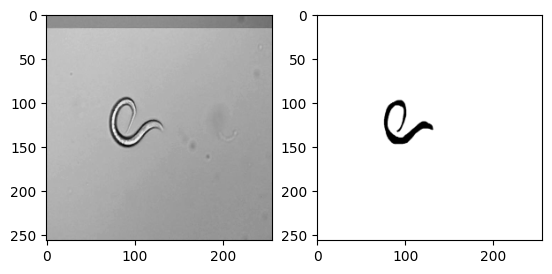

In [ ]:
# scale image arrays
# scaling benefits learning process
x_data /= 255
y_data /= 255

# display samples of image and mask in gray scale
fig, ax = plt.subplots(1, 2)
ax[0].imshow(x_data[0].squeeze(), cmap='gray')
ax[1].imshow(y_data[0].squeeze(), cmap='gray')
# ^ since imshow takes 2d array, 3d array is squeezed down to 2d by removing single dimensional entry

In [ ]:
# split dataset into train and validation datasets with 20% test portion
x_train, x_val, y_train, y_val = train_test_split(x_data, y_data, test_size=0.2)

In [ ]:
print(x_train.shape)
print(x_val.shape)


(120, 256, 256, 1)
(30, 256, 256, 1)


In [ ]:
from keras import backend as K

# Define the Dice coefficient metric
def dice_coefficient(y_true, y_pred):
    intersection = K.sum(y_true * y_pred, axis=(1, 2, 3))
    union = K.sum(y_true, axis=(1, 2, 3)) + K.sum(y_pred, axis=(1, 2, 3))
    return K.mean((2.0 * intersection + 1.0) / (union + 1.0), axis=0)

# Define the Jaccard Index (IoU) metric
def jaccard_index(y_true, y_pred):
    intersection = K.sum(y_true * y_pred, axis=(1, 2, 3))
    union = K.sum(y_true, axis=(1, 2, 3)) + K.sum(y_pred, axis=(1, 2, 3)) - intersection
    return K.mean((intersection + 1.0) / (union + 1.0), axis=0)

.**Defining the model architecture**

In [ ]:

inputs = Input(shape=(256, 256, 1))

# encoding
net = Conv2D(32, kernel_size=3, activation='relu', padding='same')(inputs)
net = MaxPooling2D(pool_size=2, padding='same')(net)
net = Conv2D(64, kernel_size=3, activation='relu', padding='same')(net)
net = MaxPooling2D(pool_size=2, padding='same')(net)
net = Conv2D(128, kernel_size=3, activation='relu', padding='same')(net)
net = MaxPooling2D(pool_size=2, padding='same')(net)

net = Dense(128, activation='relu')(net)

# decoding
net = UpSampling2D(size=2)(net)
net = Conv2D(128, kernel_size=3, activation='sigmoid', padding='same')(net)
net = UpSampling2D(size=2)(net)
net = Conv2D(64, kernel_size=3, activation='sigmoid', padding='same')(net)
net = UpSampling2D(size=2)(net)

# output with 1 channel for gray scale segmentation
outputs = Conv2D(1, kernel_size=3, activation='sigmoid', padding='same')(net)


model = Model(inputs=inputs, outputs=outputs)
# use binary cross entropy with sigmoid function
#model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc', 'mse'])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=[ dice_coefficient, jaccard_index])

model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 1)]     0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 32)      320       
                                                                 
 max_pooling2d (MaxPooling2  (None, 128, 128, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 64, 64, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 128)       73856 

In [ ]:
# reduce learning rate when not improving
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=10, verbose=1, min_lr=1e-05)

# train model
history = model.fit(x_train, y_train, validation_data=(x_val, y_val), epochs=300, batch_size=32, callbacks=[reduce_lr])

Epoch 1/300
4/4 [==============================] - 18s 2s/step - loss: 0.2008 - dice_coefficient: 0.9211 - jaccard_index: 0.8609 - val_loss: 0.1126 - val_dice_coefficient: 0.9825 - val_jaccard_index: 0.9656 - lr: 0.0010
Epoch 2/300
4/4 [==============================] - 1s 218ms/step - loss: 0.1152 - dice_coefficient: 0.9849 - jaccard_index: 0.9703 - val_loss: 0.1270 - val_dice_coefficient: 0.9863 - val_jaccard_index: 0.9730 - lr: 0.0010
Epoch 3/300
4/4 [==============================] - 1s 188ms/step - loss: 0.1252 - dice_coefficient: 0.9869 - jaccard_index: 0.9742 - val_loss: 0.1306 - val_dice_coefficient: 0.9867 - val_jaccard_index: 0.9739 - lr: 0.0010
Epoch 4/300
4/4 [==============================] - 1s 216ms/step - loss: 0.1261 - dice_coefficient: 0.9870 - jaccard_index: 0.9743 - val_loss: 0.1270 - val_dice_coefficient: 0.9864 - val_jaccard_index: 0.9732 - lr: 0.0010
Epoch 5/300
4/4 [==============================] - 1s 198ms/step - loss: 0.1201 - dice_coefficient: 0.9862 - jacca

In [ ]:
# save model
model.save('/content/drive/MyDrive/image_segmentation.model')


In [ ]:
print("Train shape:",x_train.shape, "Test shape:",y_train.shape )

Train shape: (120, 256, 256, 1) Test shape: (120, 256, 256, 1)


Text(0.5, 0, 'epoch')

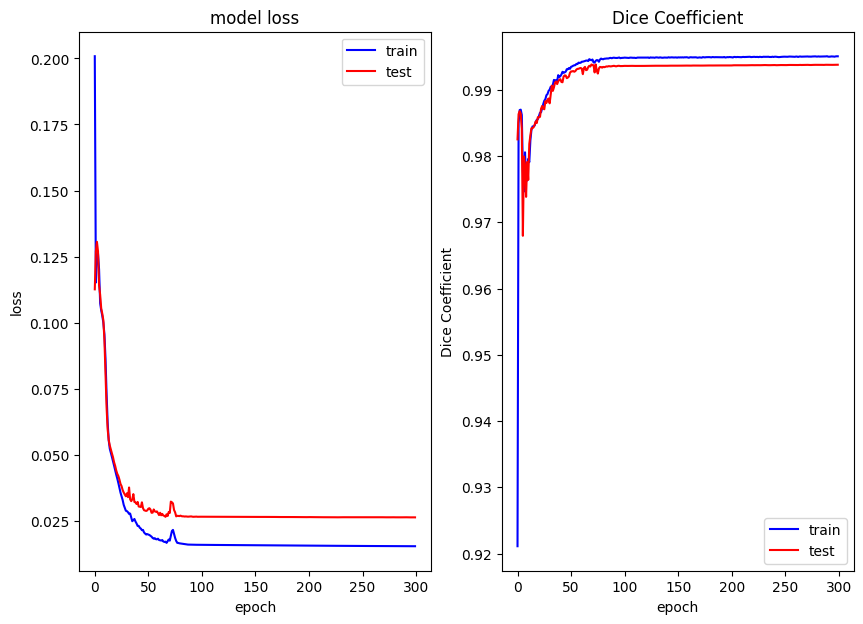

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(10, 7))

# loss
ax[0].set_title('model loss')
ax[0].plot(history.history['loss'], 'b')
ax[0].plot(history.history['val_loss'], 'r')
ax[0].legend(['train', 'test'], loc='upper right')
ax[0].set_ylabel('loss')
ax[0].set_xlabel('epoch')

# Add Dice Coefficient and Jaccard Index to the plots
ax[1].set_title('Dice Coefficient')
ax[1].plot(history.history['dice_coefficient'], 'b')  # Use 'dice_coefficient' for Dice Coefficient
ax[1].plot(history.history['val_dice_coefficient'], 'r')  # Use 'val_dice_coefficient' for validation Dice Coefficient
ax[1].legend(['train', 'test'], loc='lower right')
ax[1].set_ylabel('Dice Coefficient')
ax[1].set_xlabel('epoch')

**Inference**

In [ ]:
# Predict segmentation
preds = model.predict(x_val)
print("Shape of preds:", preds.shape)
#print("Sample Prediction (first image):\n", preds[0])

print("type of preds", type(preds))
print("type of y_train", type(y_train))
print("type of x_train", type(x_train))
print("type of x_val", type(x_val), 'shape of x_val', x_val.shape)


1/1 [==============================] - 0s 157ms/step
Shape of preds: (30, 256, 256, 1)
type of preds <class 'numpy.ndarray'>
type of y_train <class 'numpy.ndarray'>
type of x_train <class 'numpy.ndarray'>
type of x_val <class 'numpy.ndarray'> shape of x_val (30, 256, 256, 1)


Displaying the values inside the our images for demonstration and visualization purposes.

In [ ]:
num_images_to_display = min(len(x_val), len(preds))

for i in range(num_images_to_display):
    print(f"Prediction for image {i}:")
    print(preds[i])

Prediction for image 0:
[[[0.96648085]
  [0.99546957]
  [0.99596655]
  ...
  [0.9962703 ]
  [0.99597603]
  [0.9798584 ]]

 [[0.9927406 ]
  [0.9992091 ]
  [0.9993062 ]
  ...
  [0.9993393 ]
  [0.9992939 ]
  [0.9920935 ]]

 [[0.9935921 ]
  [0.9993253 ]
  [0.99937785]
  ...
  [0.99938285]
  [0.99936086]
  [0.99287933]]

 ...

 [[0.9939494 ]
  [0.99934727]
  [0.9993839 ]
  ...
  [0.99939597]
  [0.9993724 ]
  [0.9928929 ]]

 [[0.9930716 ]
  [0.9992525 ]
  [0.9993337 ]
  ...
  [0.9993642 ]
  [0.9993229 ]
  [0.99233305]]

 [[0.97200924]
  [0.9920133 ]
  [0.99269545]
  ...
  [0.99299765]
  [0.9926676 ]
  [0.9626628 ]]]
Prediction for image 1:
[[[0.96608424]
  [0.9954045 ]
  [0.99592364]
  ...
  [0.99625313]
  [0.9959507 ]
  [0.97975016]]

 [[0.99263847]
  [0.99919754]
  [0.99929893]
  ...
  [0.99933606]
  [0.9992893 ]
  [0.9920513 ]]

 [[0.9935282 ]
  [0.9993191 ]
  [0.9993741 ]
  ...
  [0.99938107]
  [0.99935836]
  [0.9928571 ]]

 ...

 [[0.9938642 ]
  [0.999338  ]
  [0.9993782 ]
  ...
  [0.99

The minimum and maximum values inside our image array to better understand the output image before performing post processing techniques.

In [ ]:
import numpy as np

# Flatten the image to a 1D array
preds_flat = preds[0].ravel()

# Calculate the minimum and maximum values
min_value = np.min(preds_flat)
max_value = np.max(preds_flat)

print(f"Minimum value: {min_value}")
print(f"Maximum value: {max_value}")


Minimum value: 0.08845975995063782
Maximum value: 0.9994445443153381


Post processing and visualization- Multipling pixels by 255 as the activation functions used will output values between 0 and 1. This causes the predicted image to not be as dark as desired compared to the masked image which is fed as an input in order for the model to learn segmentation.

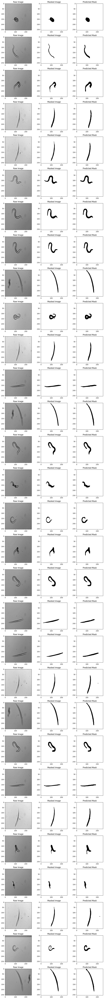

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Your existing code to create subplots
num_images_to_display = min(len(x_val), len(y_val), len(preds))

# Create a figure with subplots
fig, ax = plt.subplots(num_images_to_display, 3, figsize=(10, 3 * num_images_to_display))

threshold = 175  # Set your desired threshold value

for i in range(num_images_to_display):
    # Display the raw image
    ax[i, 0].imshow(x_val[i].squeeze() * 255, cmap='gray')
    ax[i, 0].set_title('Raw Image')

    # Display the masked image
    ax[i, 1].imshow(y_val[i].squeeze() * 255, cmap='gray')
    ax[i, 1].set_title('Masked Image')

    # Display the predicted segmentation
    binary_mask = (preds[i] * 255 > threshold).astype(np.uint8)

    # Display the binary mask
    ax[i, 2].imshow(binary_mask.squeeze(), cmap='gray')
    ax[i, 2].set_title('Predicted Mask')

# Adjust spacing between subplots
plt.tight_layout()
plt.show()

Defining the intersection over union function

In [ ]:
import numpy as np

def calculate_iou(groundtruth_mask, pred_mask):
    intersect = np.sum(pred_mask*groundtruth_mask)
    union = np.sum(pred_mask) + np.sum(groundtruth_mask)- intersect
    iou= np.mean(intersect/union)
    return round(iou,3)

In [ ]:


# Initialize a list to store IoU values for each prediction
iou_values = []

# Iterate over the predictions and ground truth
for i in range(len(y_val)):
    iou = calculate_iou(y_val[i], preds[i])
    iou_values.append(iou)

# Calculate the average IoU
average_iou = np.mean(iou_values)

print("Average IoU:", average_iou)


Average IoU: 0.9876334


Defining the Dice Co-efficient function

In [ ]:
def calculate_dice_coefficient(pred_mask,groundtruth_mask):
  intersect = np.sum(pred_mask*groundtruth_mask)
  tot_sum = np.sum(pred_mask) + np.sum(groundtruth_mask)
  dice = np.mean(2*intersect/tot_sum)
  return round(dice,3)


In [ ]:
# Initialize a list to store Dice Coefficient values for each prediction
dice_coefficient_values = []

# Iterate over the predictions and ground truth
for i in range(len(y_val)):
    dice_coefficient = calculate_dice_coefficient(y_val[i], preds[i])
    dice_coefficient_values.append(dice_coefficient)

# Calculate the average Dice Coefficient
average_dice_coefficient = np.mean(dice_coefficient_values)

print("Average Dice Coefficient:", average_dice_coefficient)


Average Dice Coefficient: 0.9937666666666666


Defining the precision function for evaluation purpose.

In [ ]:
def precision_score(groundtruth_mask, pred_mask):
    intersect = np.sum(pred_mask*groundtruth_mask)
    total_pixel_pred = np.sum(pred_mask)
    precision = np.mean(intersect/total_pixel_pred)
    return round(precision, 3)

In [ ]:


precision_values = []

# Iterate over the predictions and ground truth
for i in range(len(y_val)):
    prec = precision_score(preds[i],y_val[i])
    precision_values.append(prec)

#Calculate the average precision
average_precision = np.mean(precision_values)

print("Average Precision:", average_precision)
print("Size of :", len(precision_values))

Average Precision: 0.99416673
Size of : 30


In [ ]:
def recall_score(groundtruth_mask, pred_mask):
    intersect = np.sum(pred_mask*groundtruth_mask)
    total_pixel_truth = np.sum(groundtruth_mask)
    recall = np.mean(intersect/total_pixel_truth)
    return round(recall, 3)

In [ ]:

recall_values = []

# Iterate over the predictions and ground truth
for i in range(len(y_val)):
    rec = recall_score(preds[i],y_val[i])
    recall_values.append(rec)

#Calculate the average recall
average_recall = np.mean(recall_values)

print("Average Recall:", average_recall)
print("Size of :", len(recall_values))


Average Recall: 0.9933334
Size of : 30


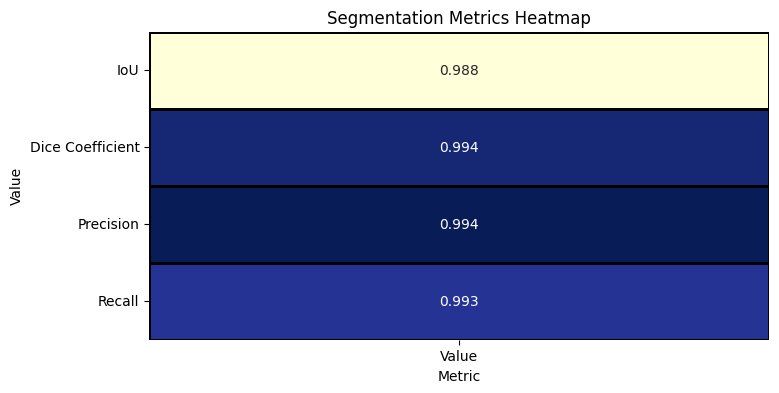

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Create a dictionary with metric values
metrics = {
    'IoU': average_iou,
    'Dice Coefficient': average_dice_coefficient,
    'Precision': average_precision,
    'Recall': average_recall
}

# Convert the dictionary to a DataFrame
df = pd.DataFrame.from_dict(metrics, orient='index', columns=['Value'])

# Create a heatmap
plt.figure(figsize=(8, 4))
sns.heatmap(df, annot=True, cmap="YlGnBu", cbar=False, fmt='0.3f', linewidths=1, linecolor='black')
plt.title("Segmentation Metrics Heatmap")
plt.xlabel("Metric")
plt.ylabel("Value")
plt.show()


**Video segmentation done by the model on an actual video. For demonstration purposes**

1/1 [==============================] - 1s 576ms/step


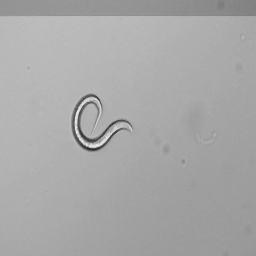

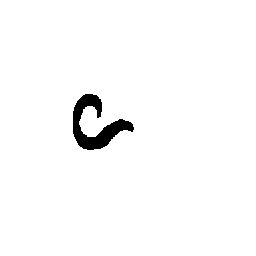

1/1 [==============================] - 0s 29ms/step


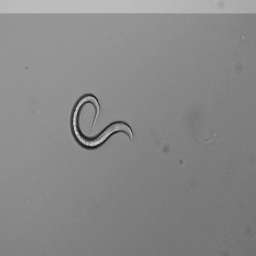

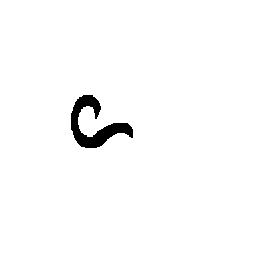

1/1 [==============================] - 0s 28ms/step


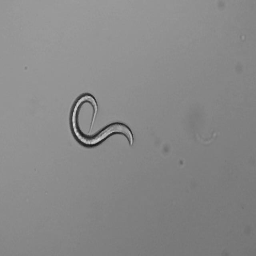

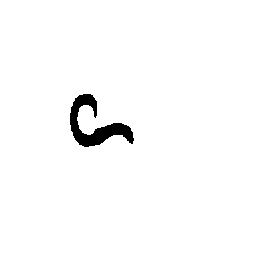

1/1 [==============================] - 0s 27ms/step


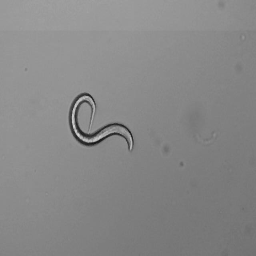

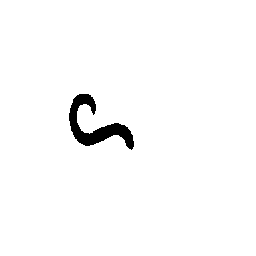

1/1 [==============================] - 0s 29ms/step


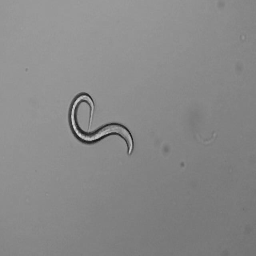

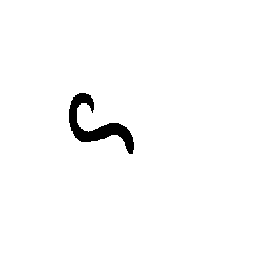

1/1 [==============================] - 0s 27ms/step


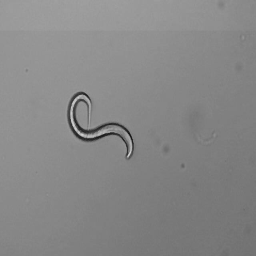

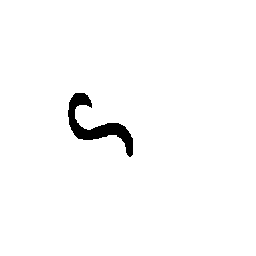

1/1 [==============================] - 0s 29ms/step


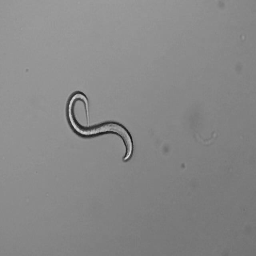

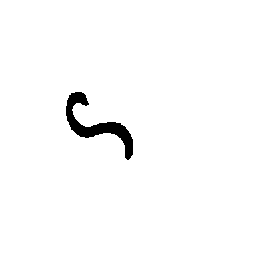

1/1 [==============================] - 0s 28ms/step


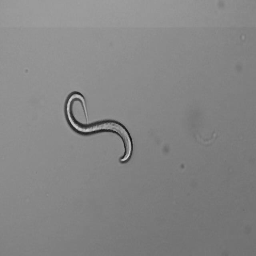

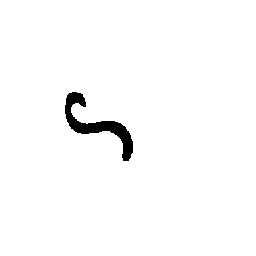

1/1 [==============================] - 0s 38ms/step


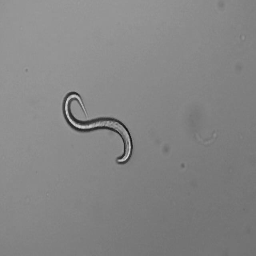

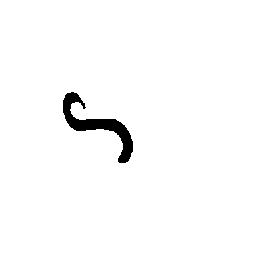

1/1 [==============================] - 0s 30ms/step


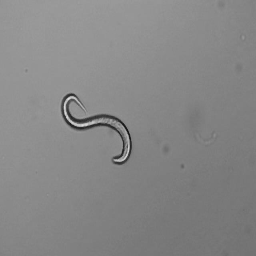

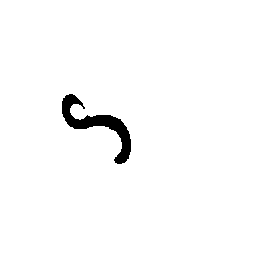

1/1 [==============================] - 0s 29ms/step


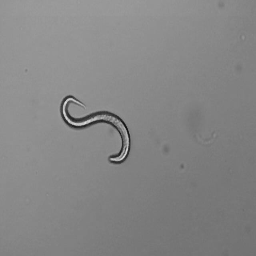

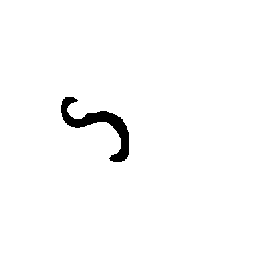

1/1 [==============================] - 0s 27ms/step


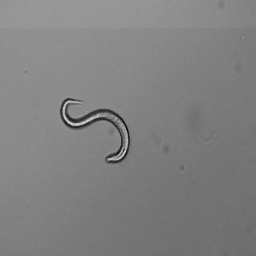

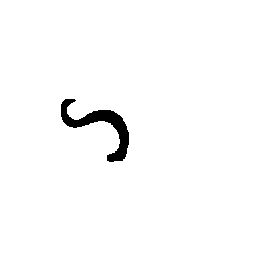

1/1 [==============================] - 0s 18ms/step


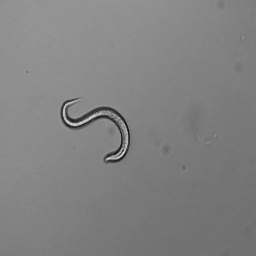

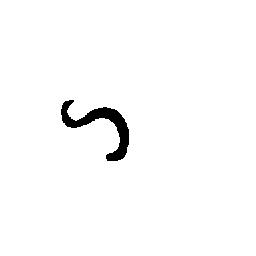

1/1 [==============================] - 0s 18ms/step


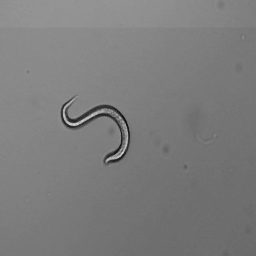

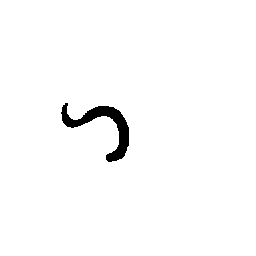

1/1 [==============================] - 0s 19ms/step


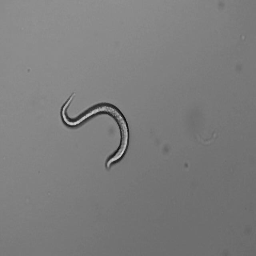

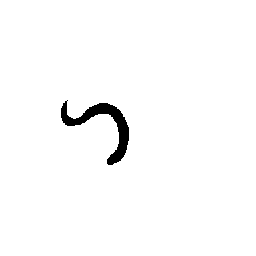

1/1 [==============================] - 0s 19ms/step


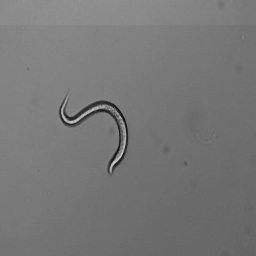

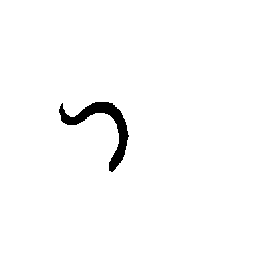

1/1 [==============================] - 0s 17ms/step


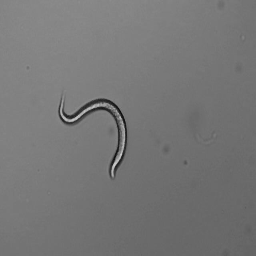

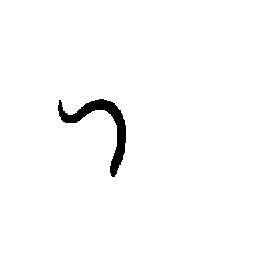

1/1 [==============================] - 0s 19ms/step


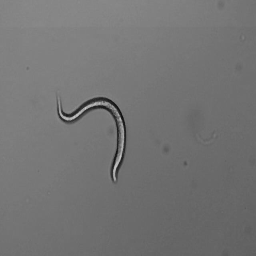

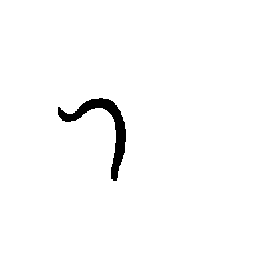

1/1 [==============================] - 0s 22ms/step


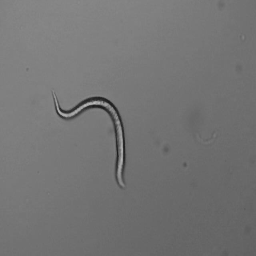

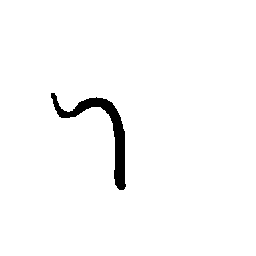

1/1 [==============================] - 0s 26ms/step


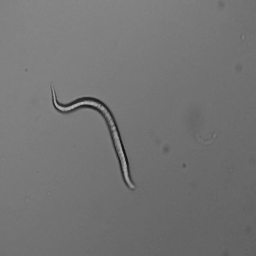

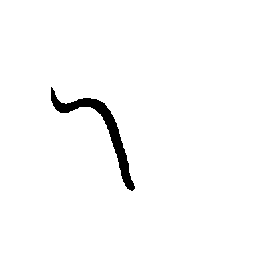

1/1 [==============================] - 0s 20ms/step


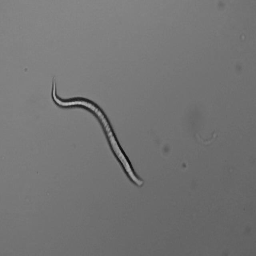

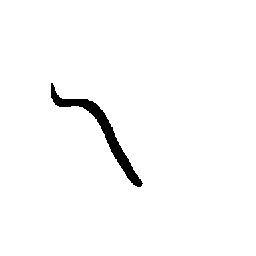

1/1 [==============================] - 0s 20ms/step


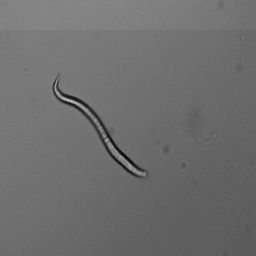

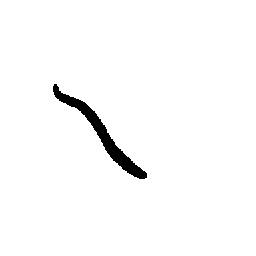

1/1 [==============================] - 0s 21ms/step


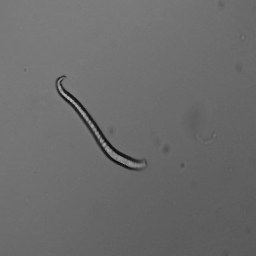

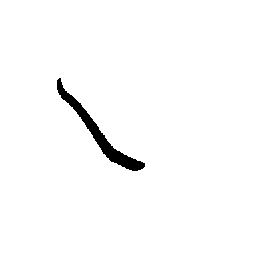

1/1 [==============================] - 0s 21ms/step


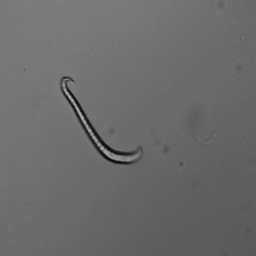

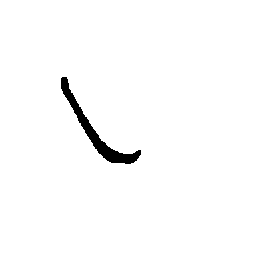

1/1 [==============================] - 0s 19ms/step


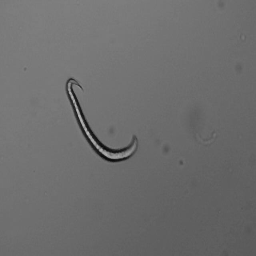

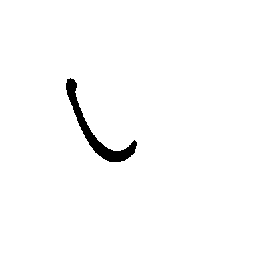

1/1 [==============================] - 0s 20ms/step


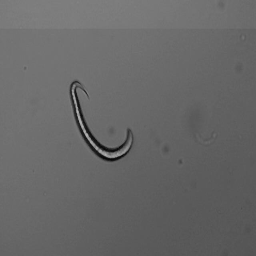

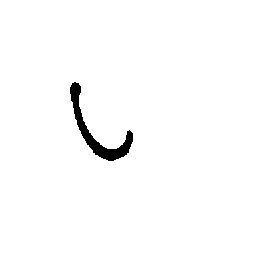

1/1 [==============================] - 0s 19ms/step


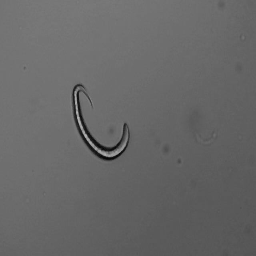

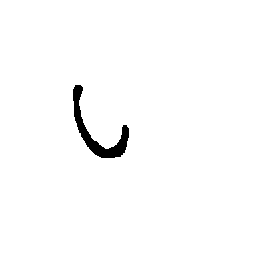

1/1 [==============================] - 0s 21ms/step


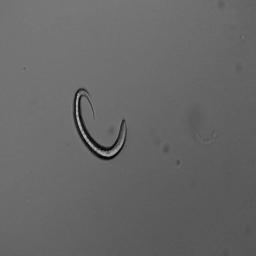

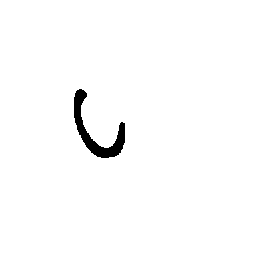

1/1 [==============================] - 0s 19ms/step


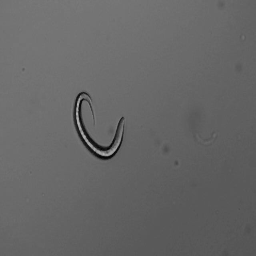

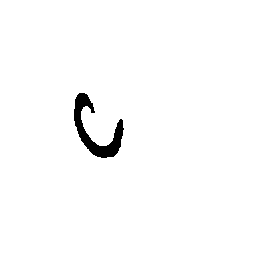

1/1 [==============================] - 0s 19ms/step


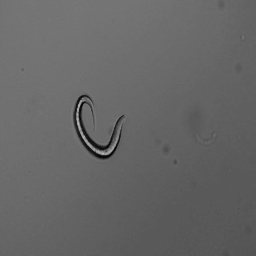

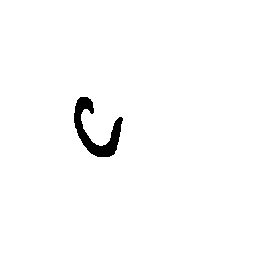

1/1 [==============================] - 0s 25ms/step


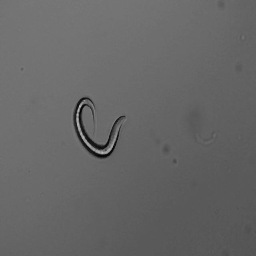

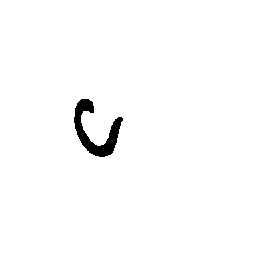

1/1 [==============================] - 0s 20ms/step


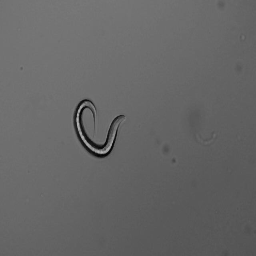

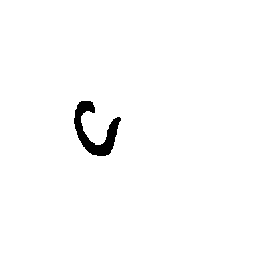

1/1 [==============================] - 0s 21ms/step


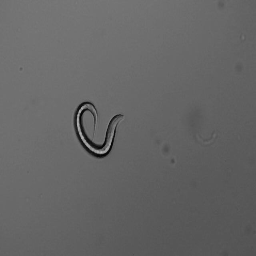

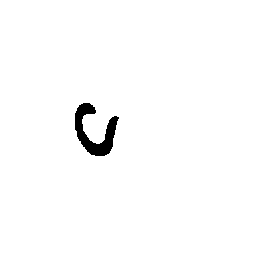

1/1 [==============================] - 0s 21ms/step


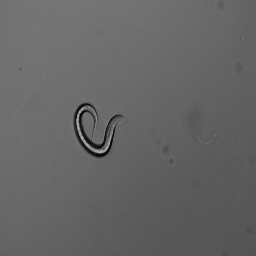

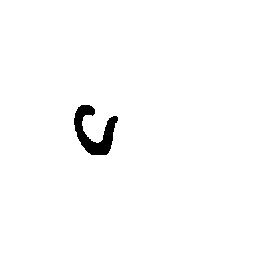

1/1 [==============================] - 0s 21ms/step


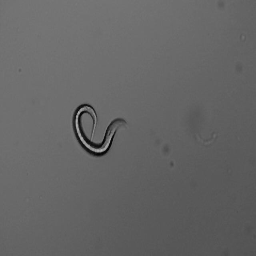

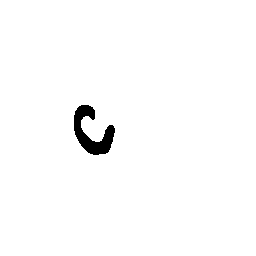

1/1 [==============================] - 0s 20ms/step


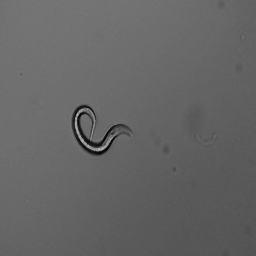

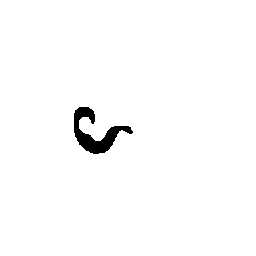

1/1 [==============================] - 0s 21ms/step


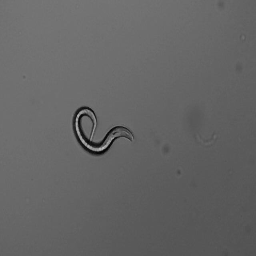

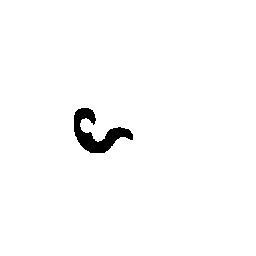

1/1 [==============================] - 0s 21ms/step


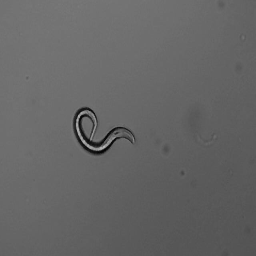

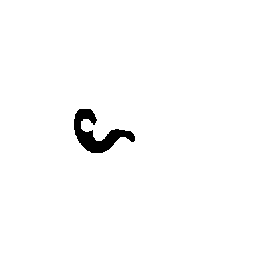

1/1 [==============================] - 0s 21ms/step


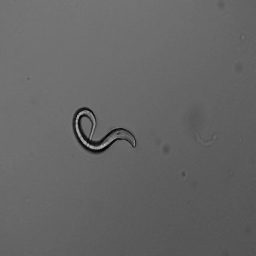

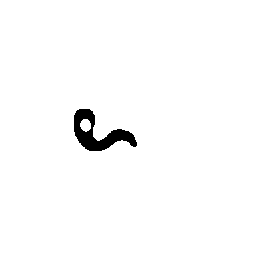

1/1 [==============================] - 0s 20ms/step


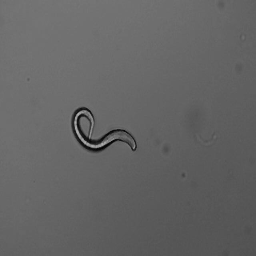

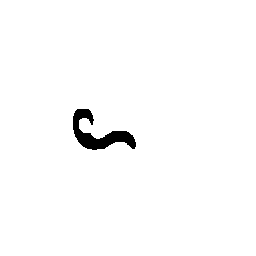

1/1 [==============================] - 0s 21ms/step


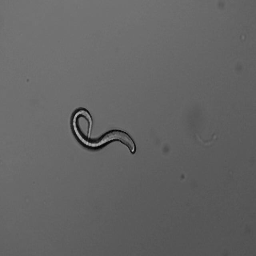

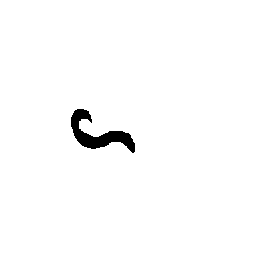

1/1 [==============================] - 0s 32ms/step


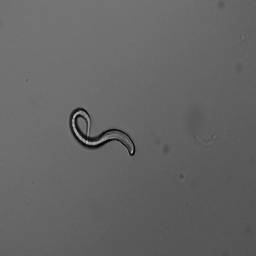

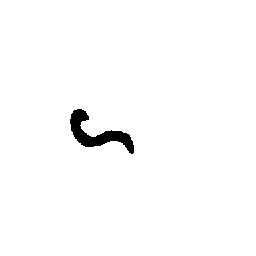

1/1 [==============================] - 0s 22ms/step


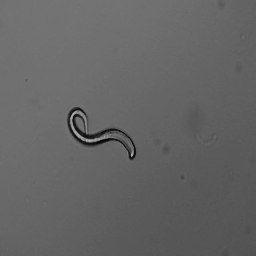

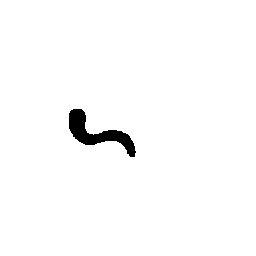

1/1 [==============================] - 0s 19ms/step


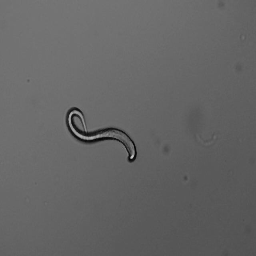

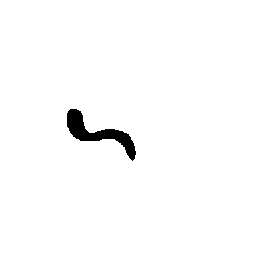

1/1 [==============================] - 0s 19ms/step


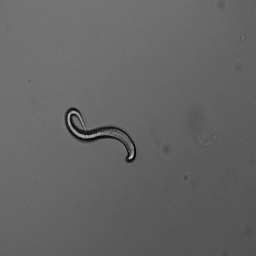

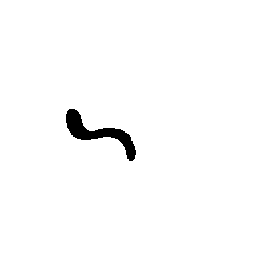

1/1 [==============================] - 0s 28ms/step


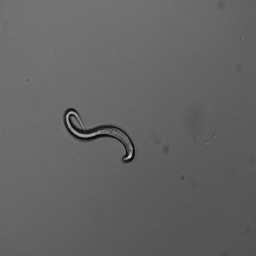

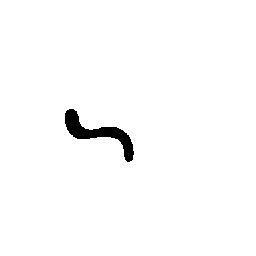

1/1 [==============================] - 0s 31ms/step


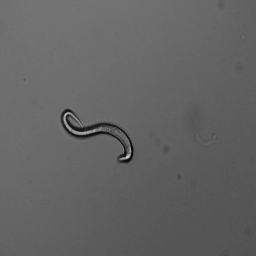

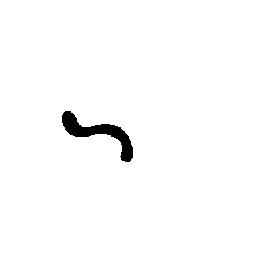

1/1 [==============================] - 0s 23ms/step


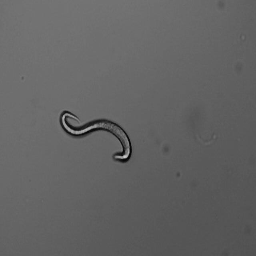

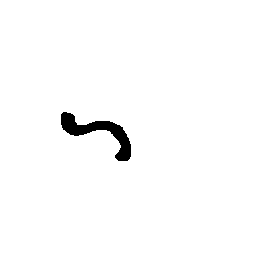

1/1 [==============================] - 0s 23ms/step


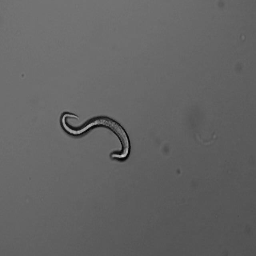

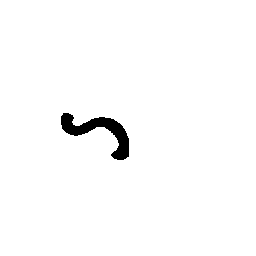

1/1 [==============================] - 0s 24ms/step


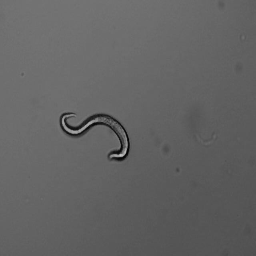

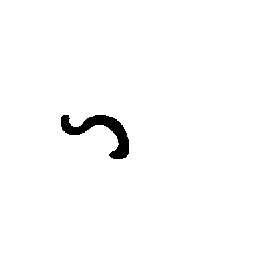

1/1 [==============================] - 0s 24ms/step


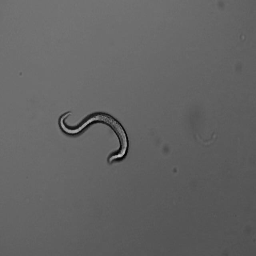

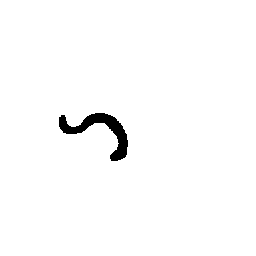

1/1 [==============================] - 0s 26ms/step


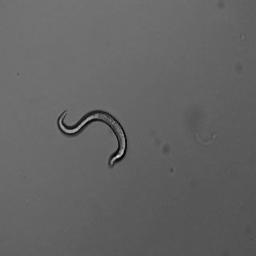

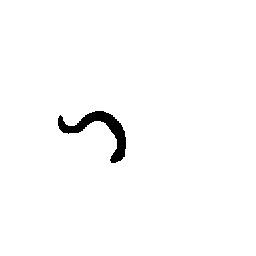

1/1 [==============================] - 0s 25ms/step


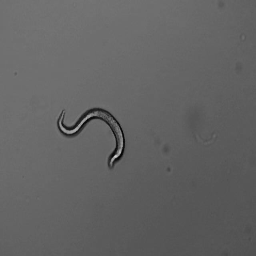

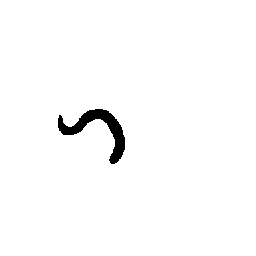

1/1 [==============================] - 0s 26ms/step


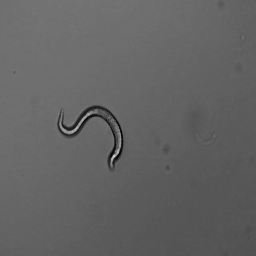

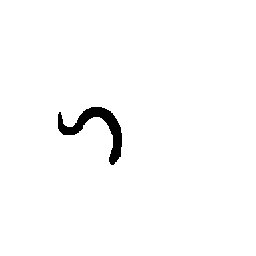

1/1 [==============================] - 0s 27ms/step


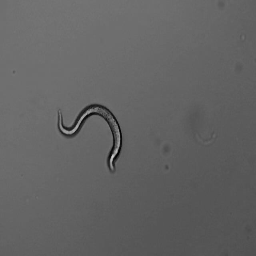

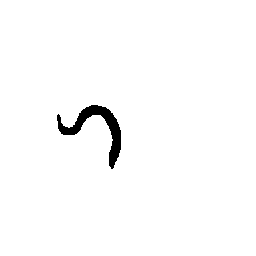

1/1 [==============================] - 0s 27ms/step


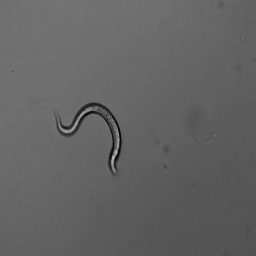

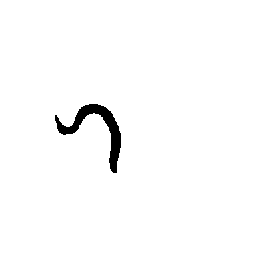

1/1 [==============================] - 0s 30ms/step


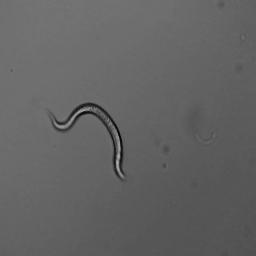

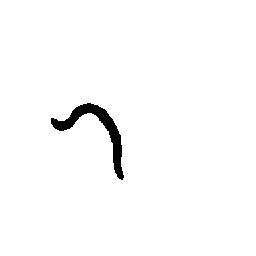

1/1 [==============================] - 0s 29ms/step


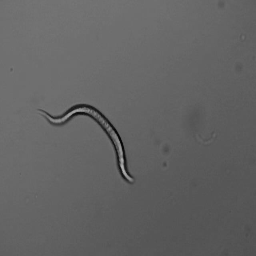

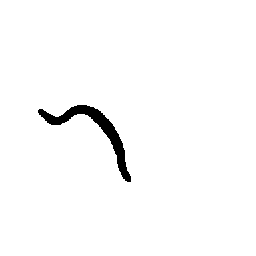

1/1 [==============================] - 0s 26ms/step


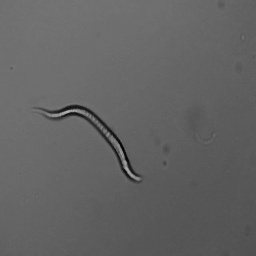

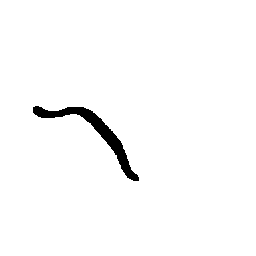

1/1 [==============================] - 0s 26ms/step


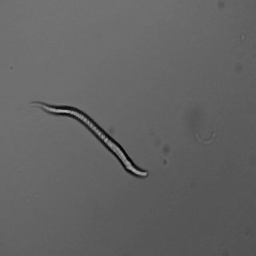

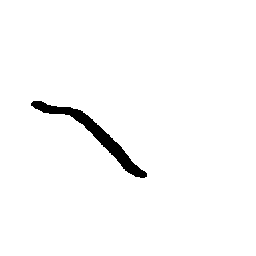

1/1 [==============================] - 0s 26ms/step


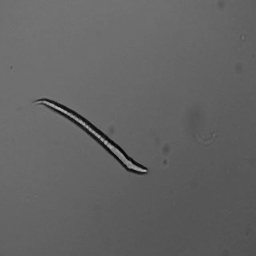

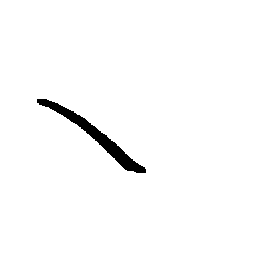

1/1 [==============================] - 0s 25ms/step


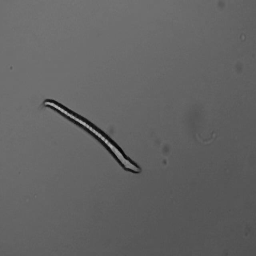

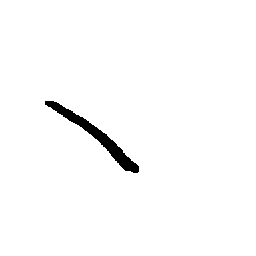

1/1 [==============================] - 0s 29ms/step


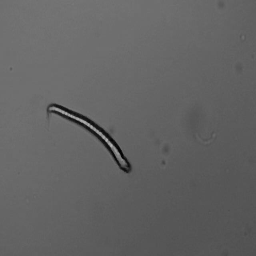

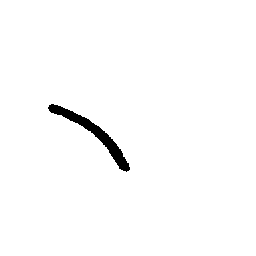

1/1 [==============================] - 0s 27ms/step


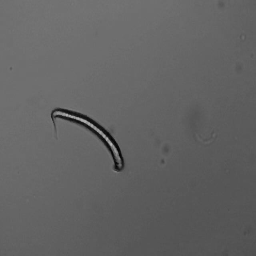

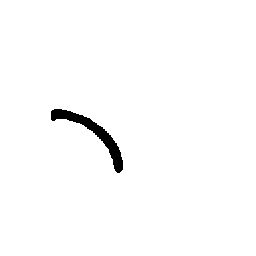

1/1 [==============================] - 0s 35ms/step


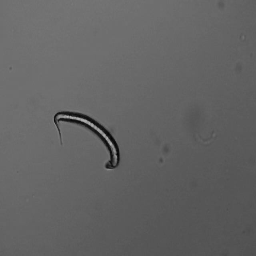

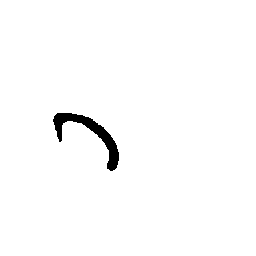

1/1 [==============================] - 0s 27ms/step


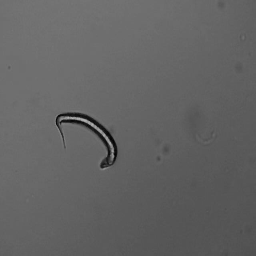

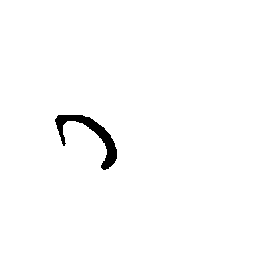

1/1 [==============================] - 0s 28ms/step


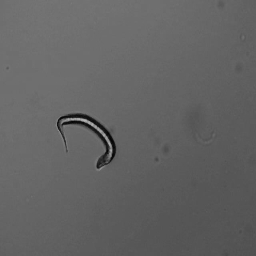

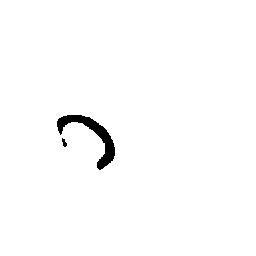

1/1 [==============================] - 0s 30ms/step


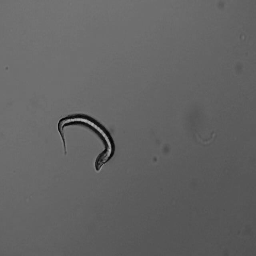

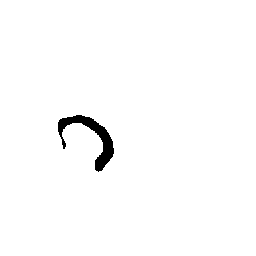

1/1 [==============================] - 0s 30ms/step


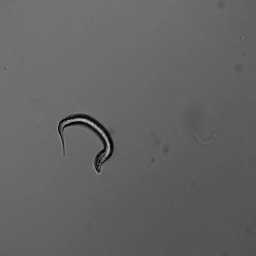

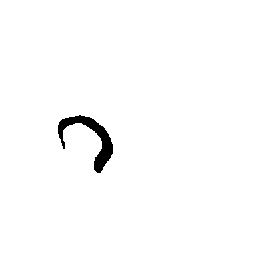

1/1 [==============================] - 0s 27ms/step


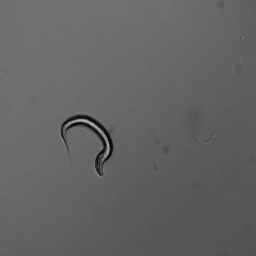

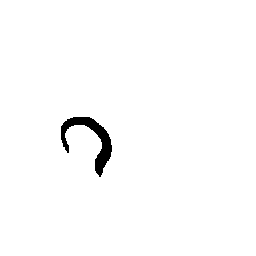

1/1 [==============================] - 0s 26ms/step


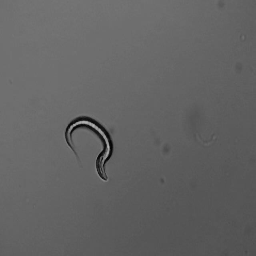

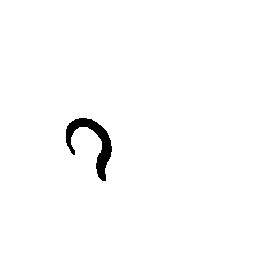

1/1 [==============================] - 0s 29ms/step


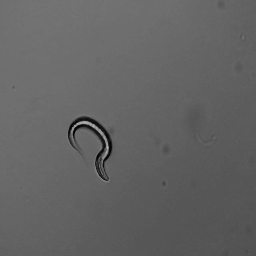

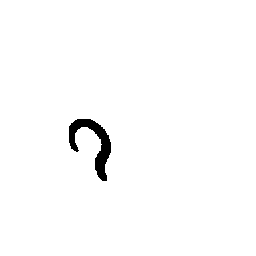

1/1 [==============================] - 0s 33ms/step


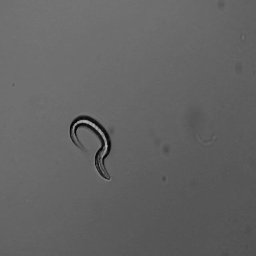

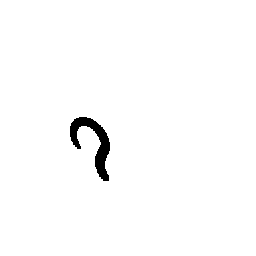

1/1 [==============================] - 0s 29ms/step


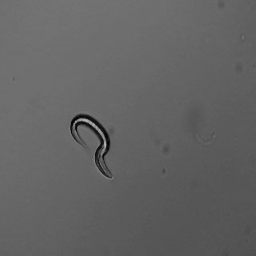

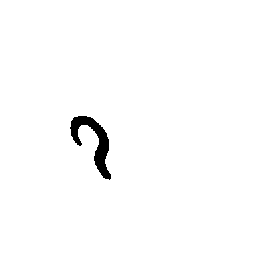

1/1 [==============================] - 0s 27ms/step


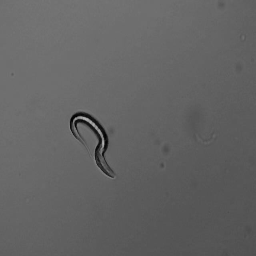

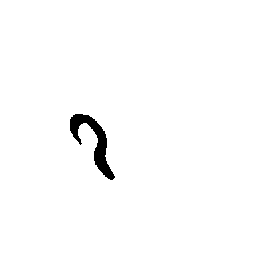

1/1 [==============================] - 0s 29ms/step


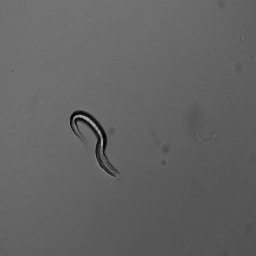

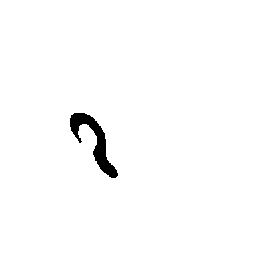

1/1 [==============================] - 0s 26ms/step


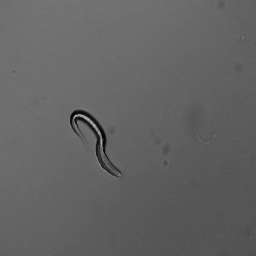

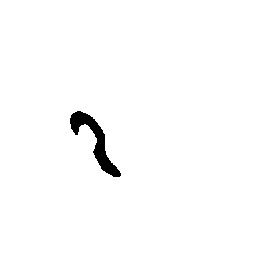

1/1 [==============================] - 0s 27ms/step


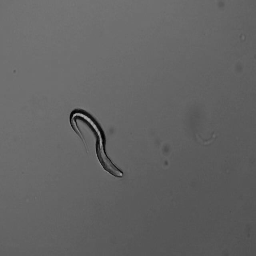

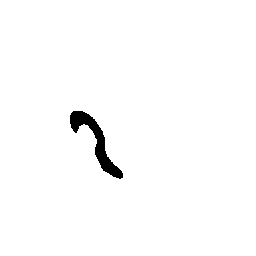

1/1 [==============================] - 0s 27ms/step


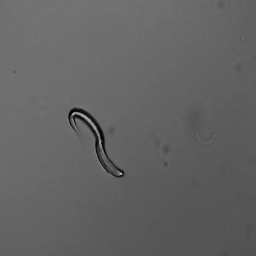

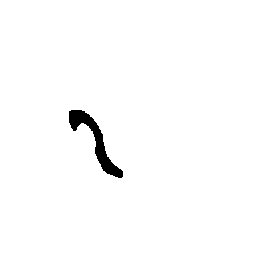

1/1 [==============================] - 0s 26ms/step


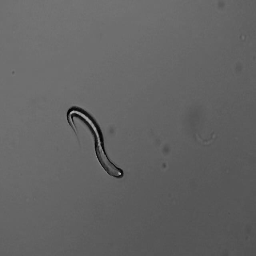

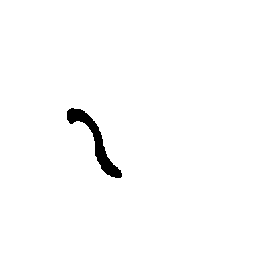

1/1 [==============================] - 0s 28ms/step


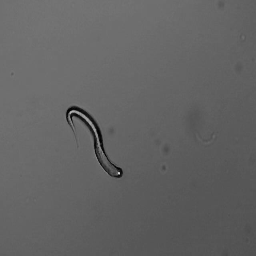

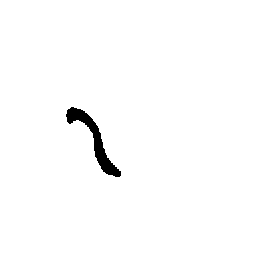

1/1 [==============================] - 0s 29ms/step


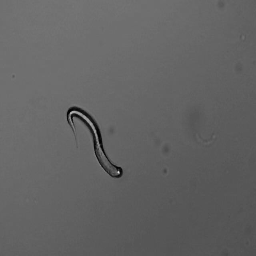

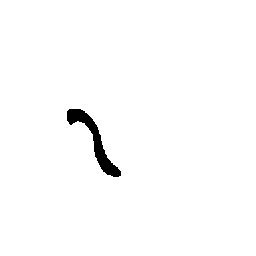

1/1 [==============================] - 0s 28ms/step


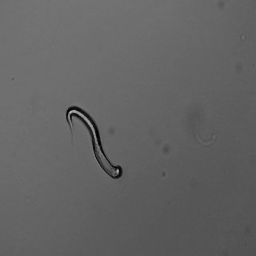

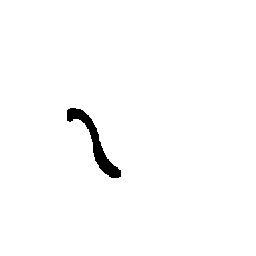

1/1 [==============================] - 0s 28ms/step


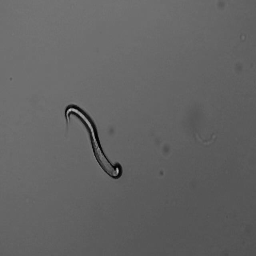

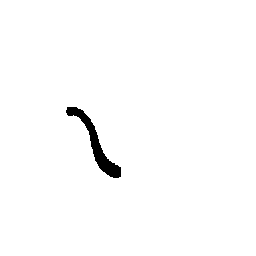

1/1 [==============================] - 0s 28ms/step


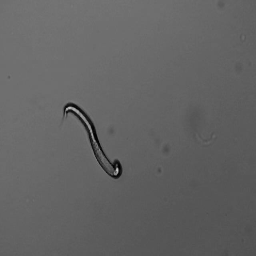

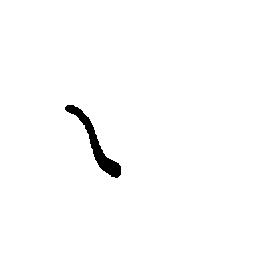

1/1 [==============================] - 0s 28ms/step


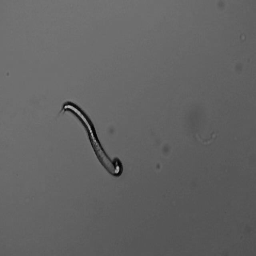

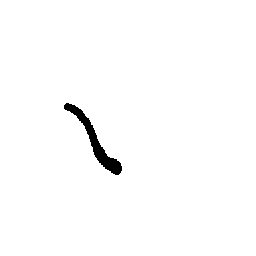

1/1 [==============================] - 0s 27ms/step


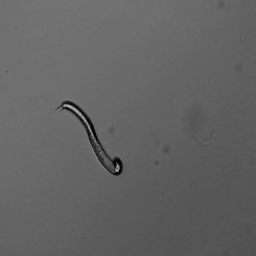

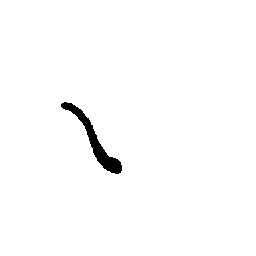

1/1 [==============================] - 0s 26ms/step


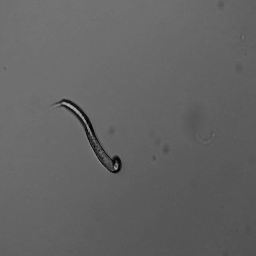

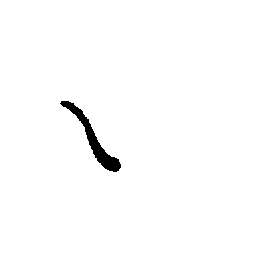

1/1 [==============================] - 0s 35ms/step


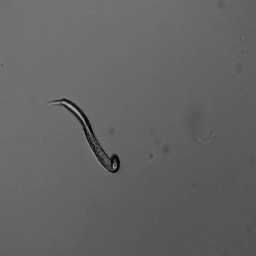

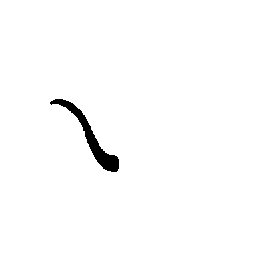

1/1 [==============================] - 0s 30ms/step


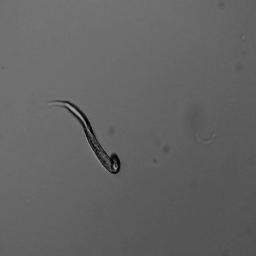

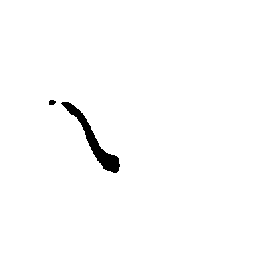

1/1 [==============================] - 0s 26ms/step


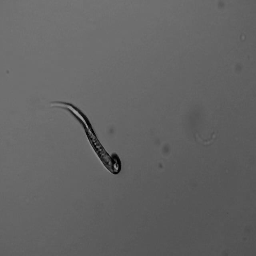

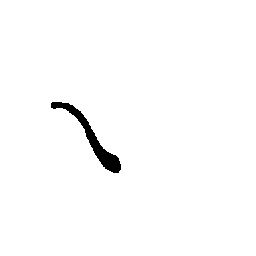

1/1 [==============================] - 0s 30ms/step


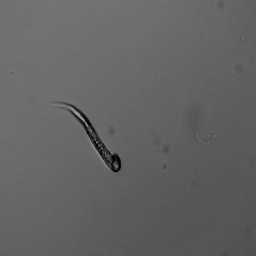

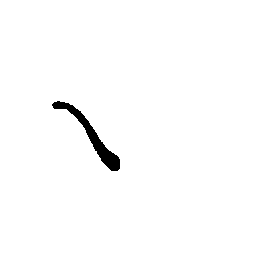

1/1 [==============================] - 0s 27ms/step


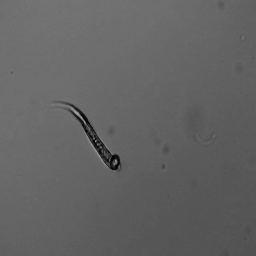

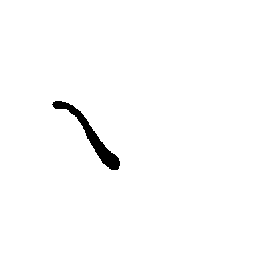

1/1 [==============================] - 0s 28ms/step


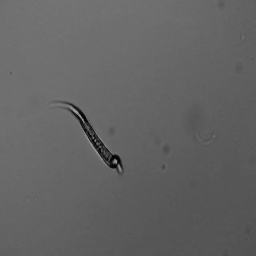

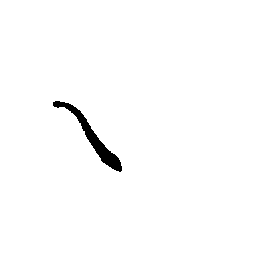

1/1 [==============================] - 0s 27ms/step


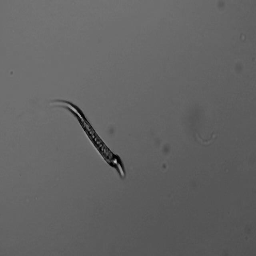

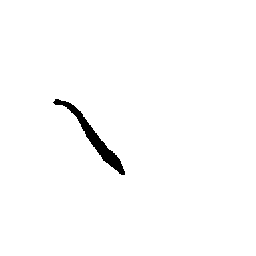

1/1 [==============================] - 0s 30ms/step


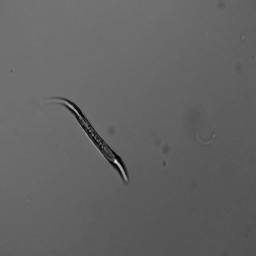

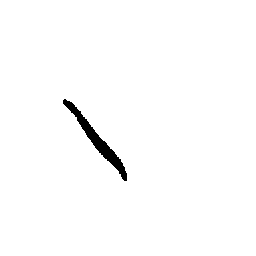

1/1 [==============================] - 0s 29ms/step


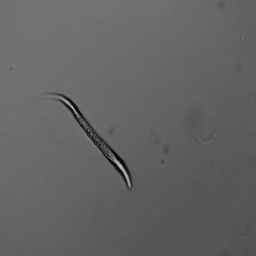

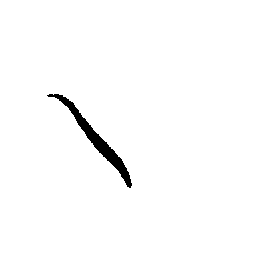

1/1 [==============================] - 0s 27ms/step


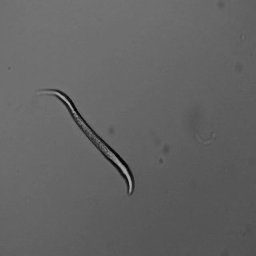

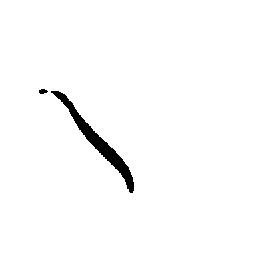

1/1 [==============================] - 0s 29ms/step


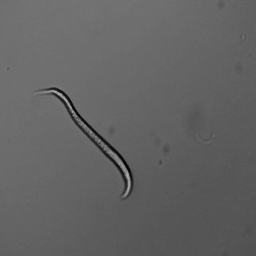

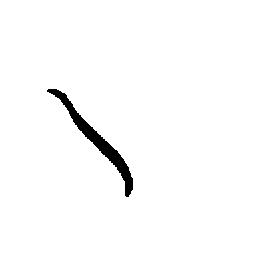

1/1 [==============================] - 0s 29ms/step


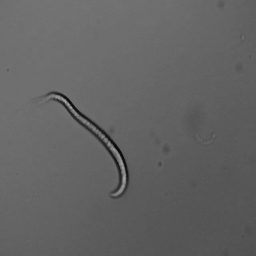

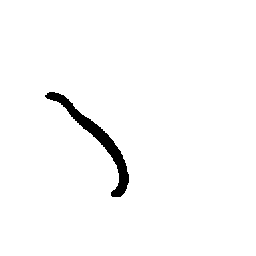

1/1 [==============================] - 0s 28ms/step


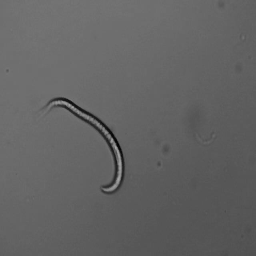

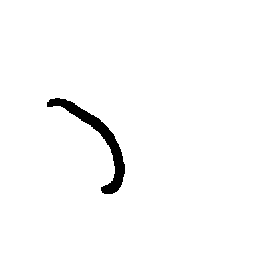

1/1 [==============================] - 0s 31ms/step


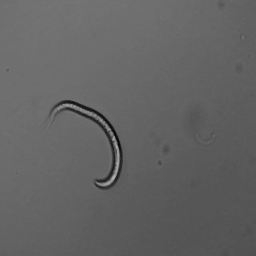

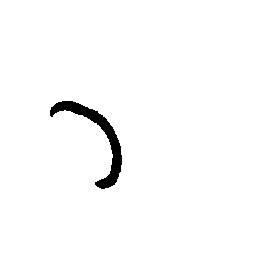

1/1 [==============================] - 0s 27ms/step


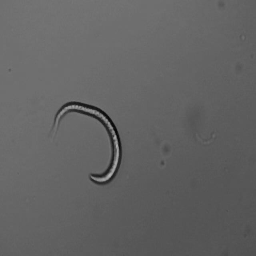

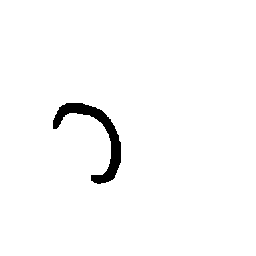

1/1 [==============================] - 0s 34ms/step


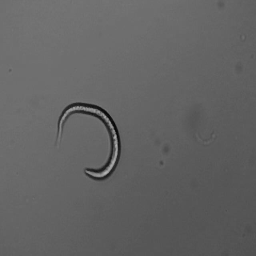

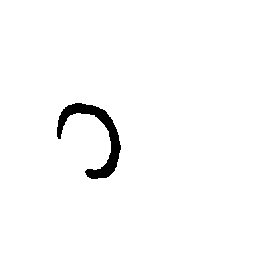

1/1 [==============================] - 0s 28ms/step


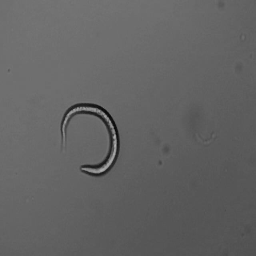

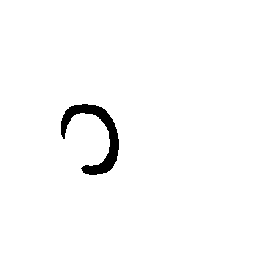

1/1 [==============================] - 0s 27ms/step


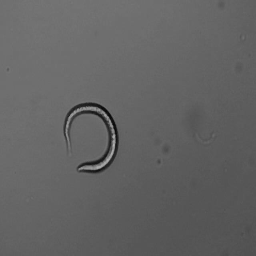

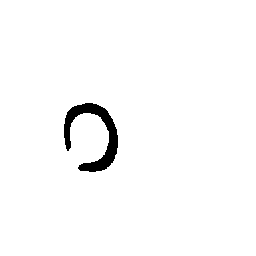

1/1 [==============================] - 0s 26ms/step


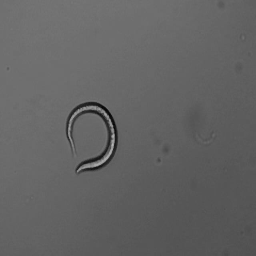

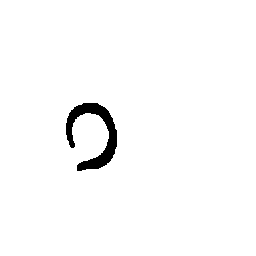

1/1 [==============================] - 0s 28ms/step


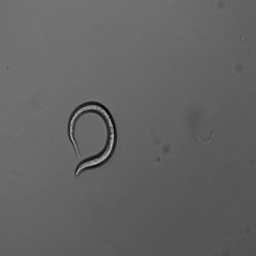

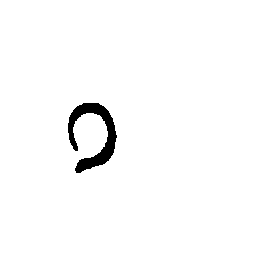

1/1 [==============================] - 0s 28ms/step


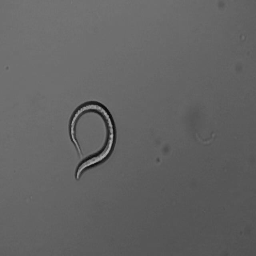

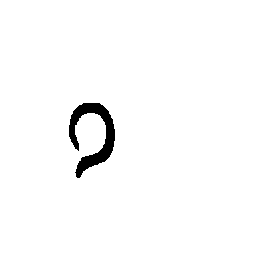

1/1 [==============================] - 0s 27ms/step


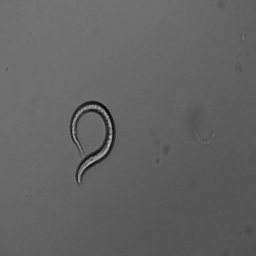

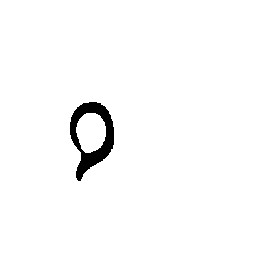

1/1 [==============================] - 0s 28ms/step


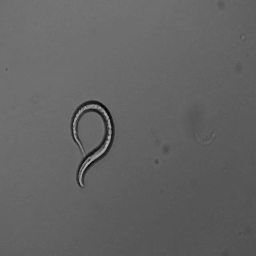

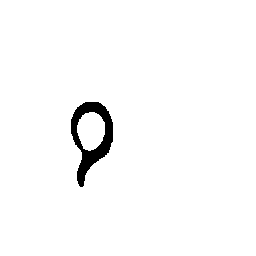

1/1 [==============================] - 0s 27ms/step


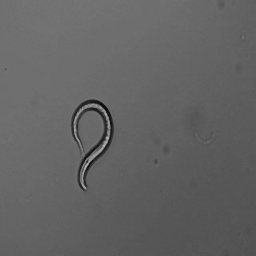

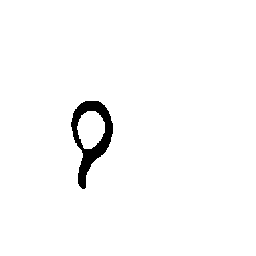

1/1 [==============================] - 0s 26ms/step


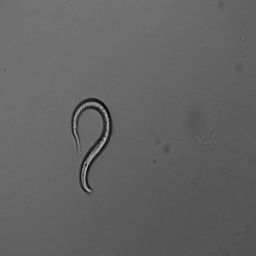

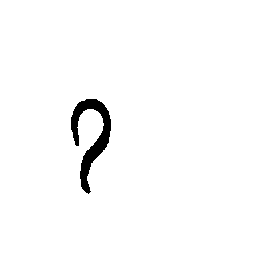

1/1 [==============================] - 0s 40ms/step


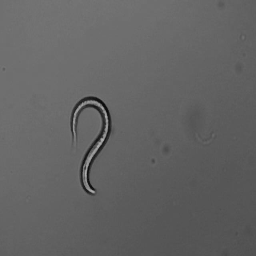

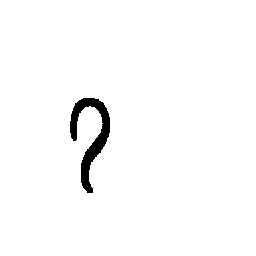

1/1 [==============================] - 0s 42ms/step


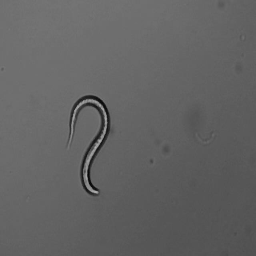

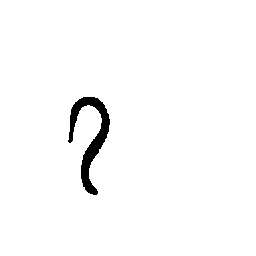

1/1 [==============================] - 0s 27ms/step


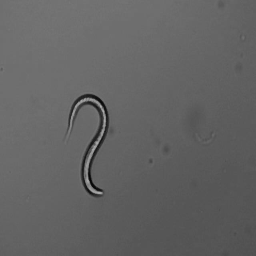

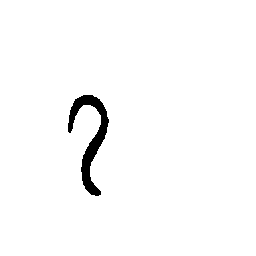

1/1 [==============================] - 0s 28ms/step


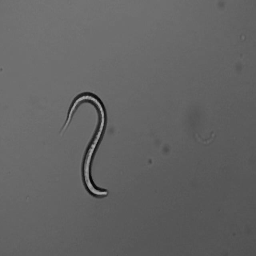

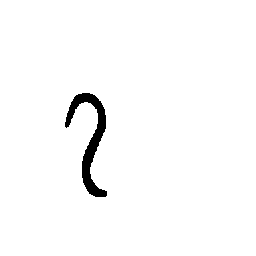

1/1 [==============================] - 0s 29ms/step


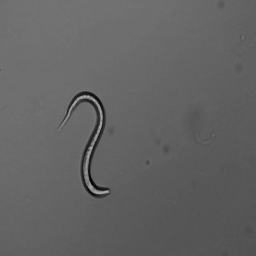

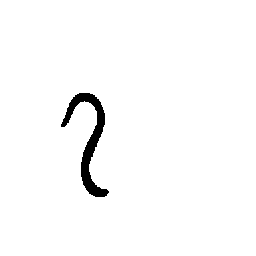

1/1 [==============================] - 0s 37ms/step


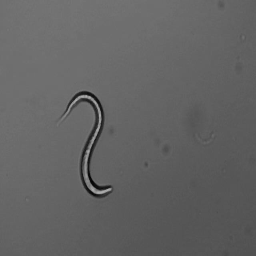

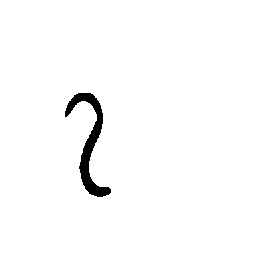

1/1 [==============================] - 0s 30ms/step


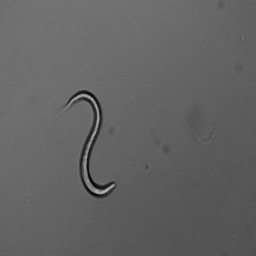

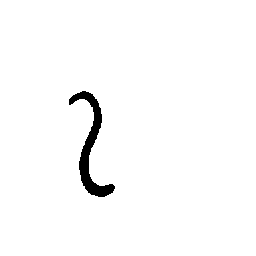

1/1 [==============================] - 0s 26ms/step


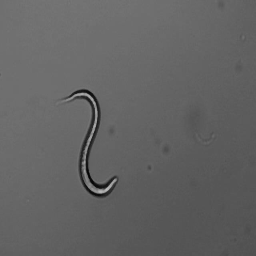

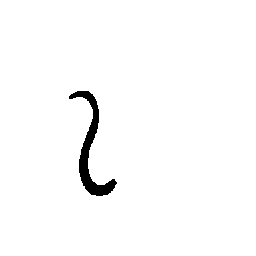

1/1 [==============================] - 0s 27ms/step


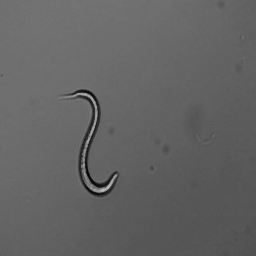

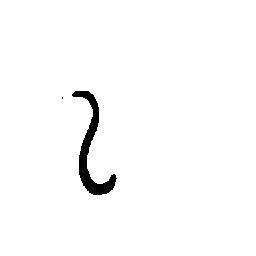

1/1 [==============================] - 0s 29ms/step


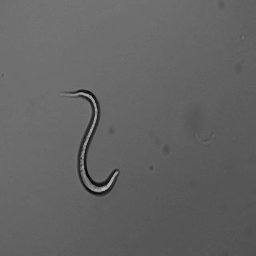

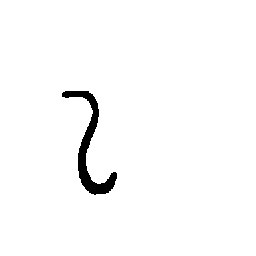

1/1 [==============================] - 0s 26ms/step


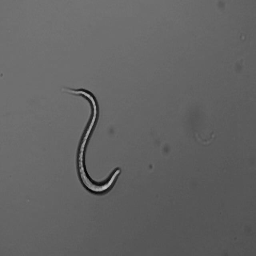

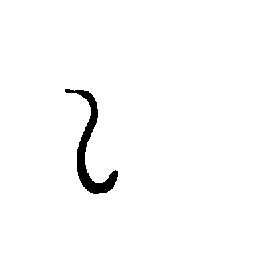

1/1 [==============================] - 0s 28ms/step


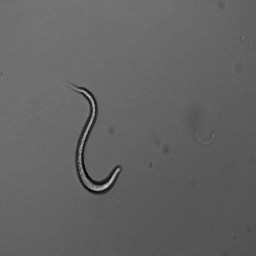

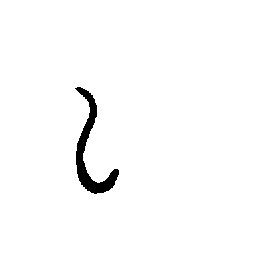

1/1 [==============================] - 0s 45ms/step


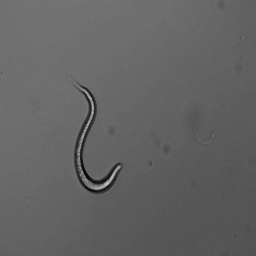

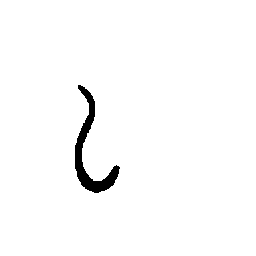

1/1 [==============================] - 0s 34ms/step


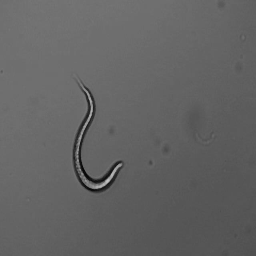

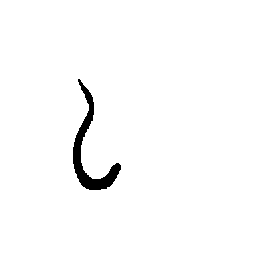

1/1 [==============================] - 0s 36ms/step


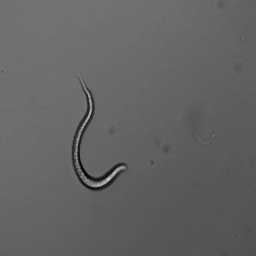

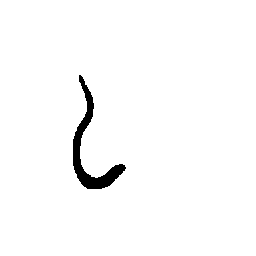

1/1 [==============================] - 0s 33ms/step


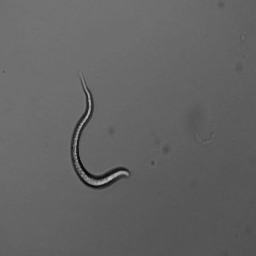

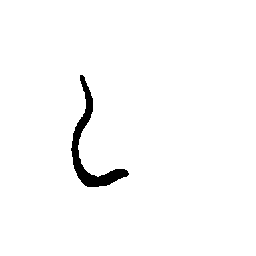

1/1 [==============================] - 0s 30ms/step


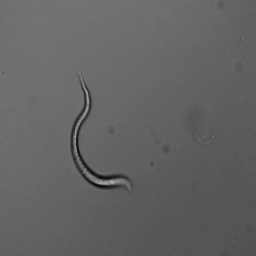

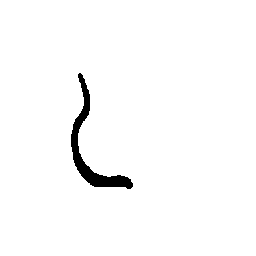

1/1 [==============================] - 0s 55ms/step


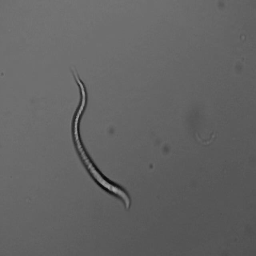

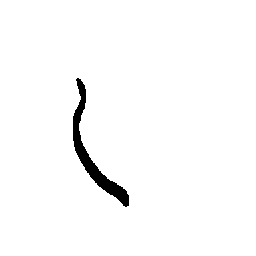

1/1 [==============================] - 0s 49ms/step


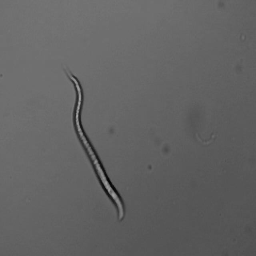

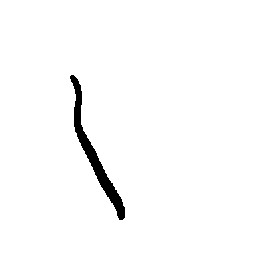

1/1 [==============================] - 0s 32ms/step


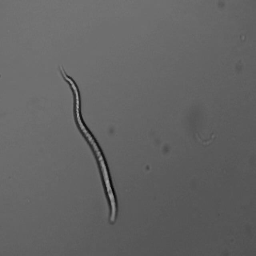

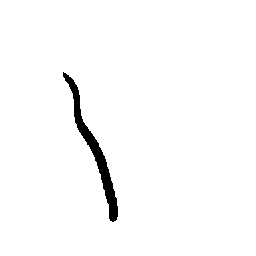

1/1 [==============================] - 0s 39ms/step


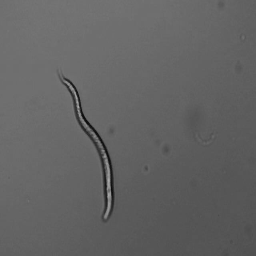

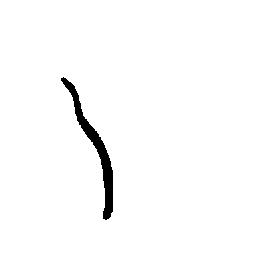

1/1 [==============================] - 0s 33ms/step


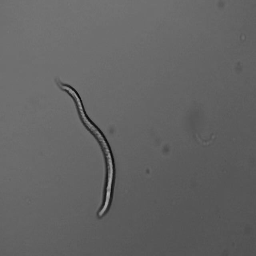

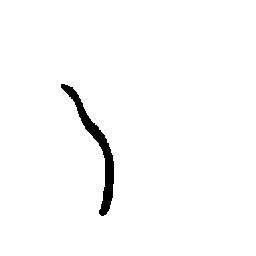

1/1 [==============================] - 0s 35ms/step


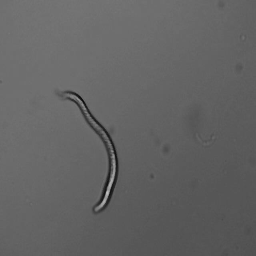

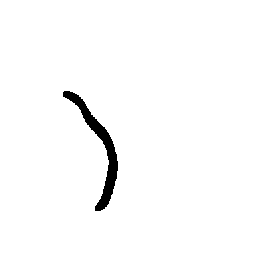

1/1 [==============================] - 0s 37ms/step


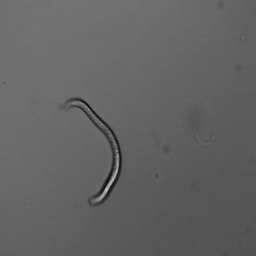

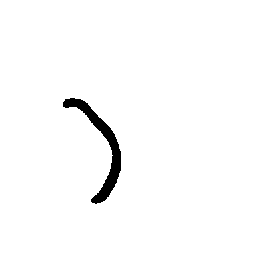

1/1 [==============================] - 0s 32ms/step


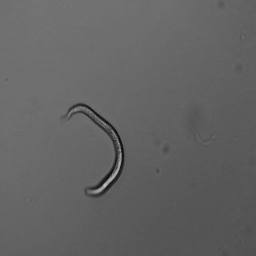

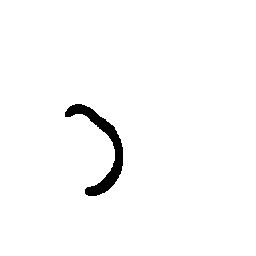

1/1 [==============================] - 0s 56ms/step


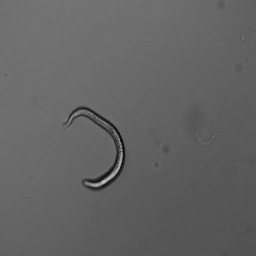

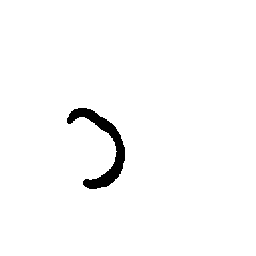

1/1 [==============================] - 0s 54ms/step


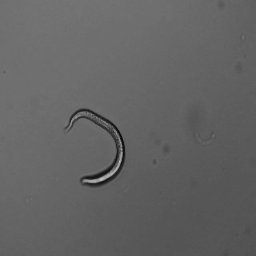

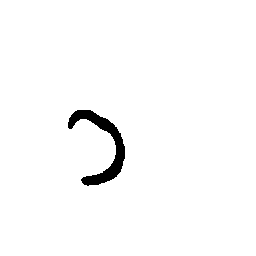

1/1 [==============================] - 0s 57ms/step


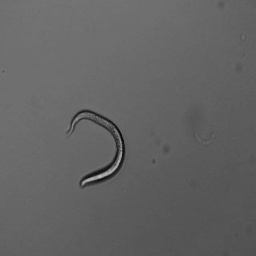

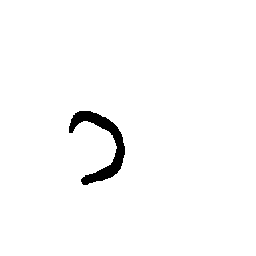

1/1 [==============================] - 0s 42ms/step


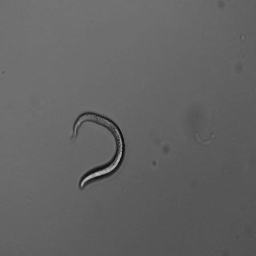

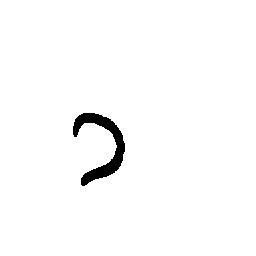

1/1 [==============================] - 0s 31ms/step


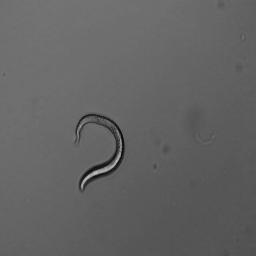

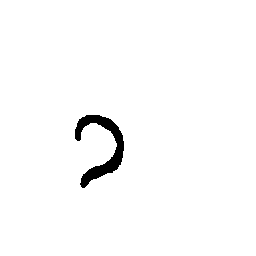

1/1 [==============================] - 0s 46ms/step


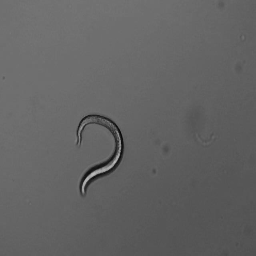

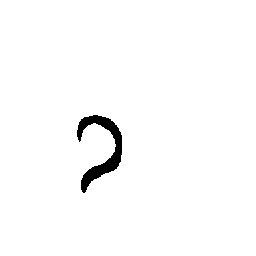

1/1 [==============================] - 0s 34ms/step


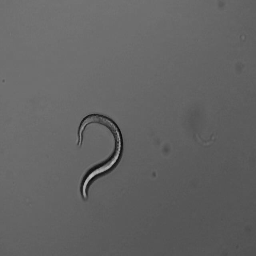

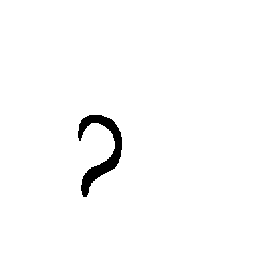

1/1 [==============================] - 0s 35ms/step


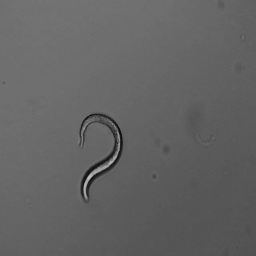

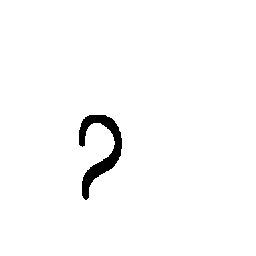

1/1 [==============================] - 0s 43ms/step


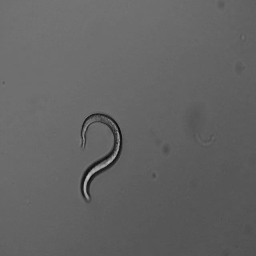

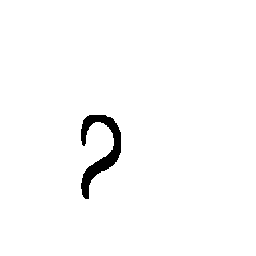

1/1 [==============================] - 0s 57ms/step


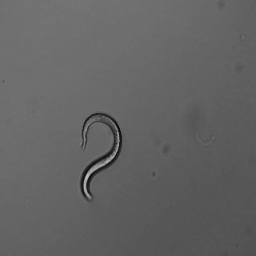

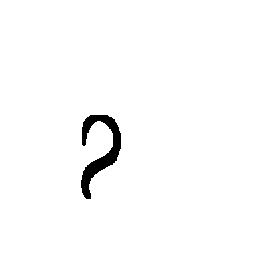

1/1 [==============================] - 0s 62ms/step


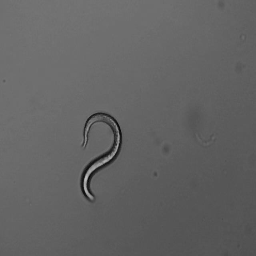

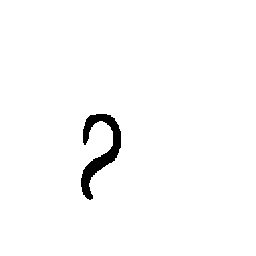

1/1 [==============================] - 0s 38ms/step


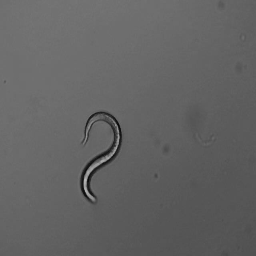

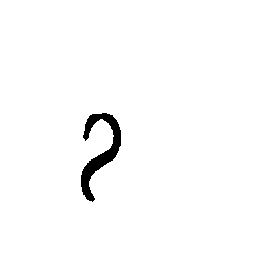

1/1 [==============================] - 0s 29ms/step


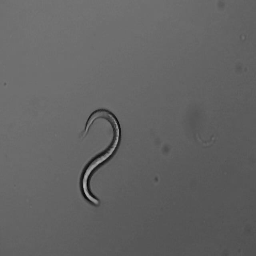

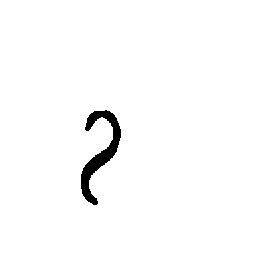

1/1 [==============================] - 0s 29ms/step


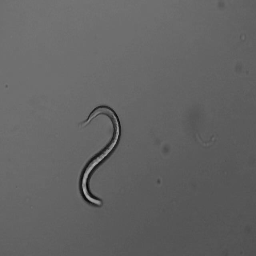

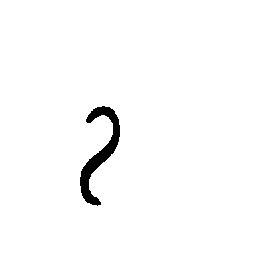

1/1 [==============================] - 0s 26ms/step


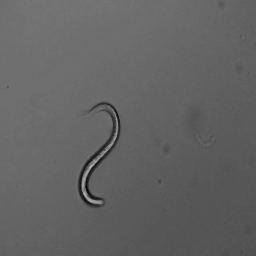

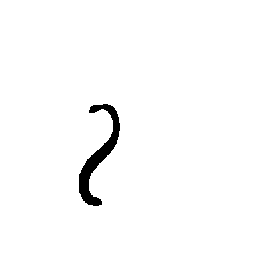

1/1 [==============================] - 0s 27ms/step


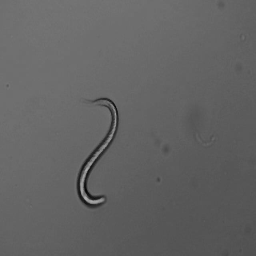

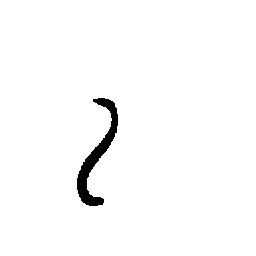

1/1 [==============================] - 0s 39ms/step


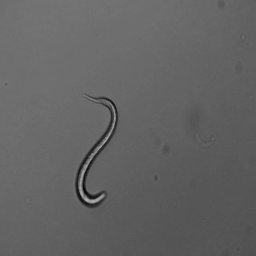

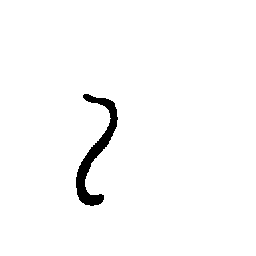

1/1 [==============================] - 0s 28ms/step


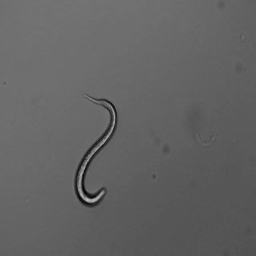

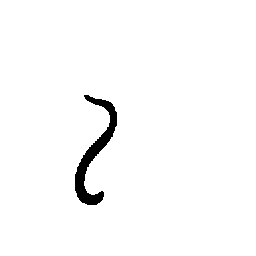

1/1 [==============================] - 0s 27ms/step


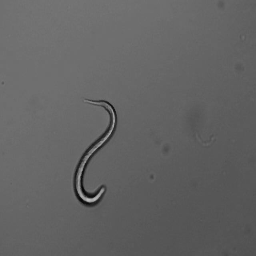

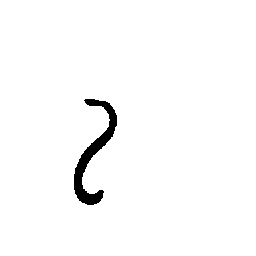

1/1 [==============================] - 0s 27ms/step


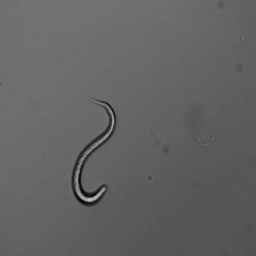

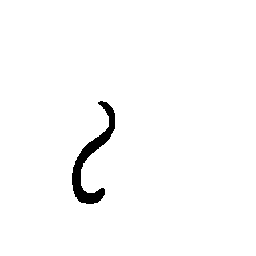

1/1 [==============================] - 0s 26ms/step


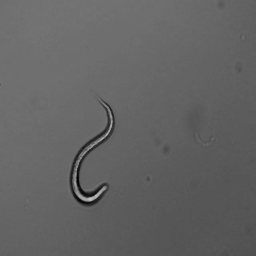

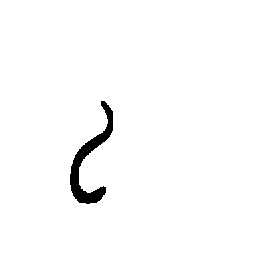

1/1 [==============================] - 0s 27ms/step


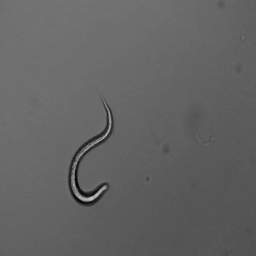

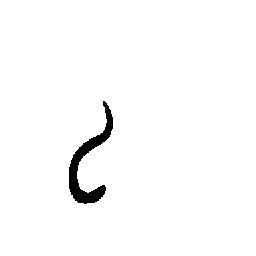

1/1 [==============================] - 0s 26ms/step


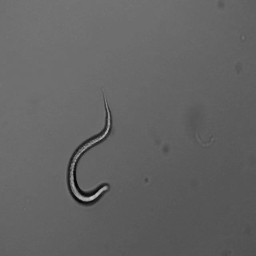

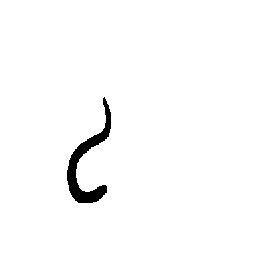

1/1 [==============================] - 0s 32ms/step


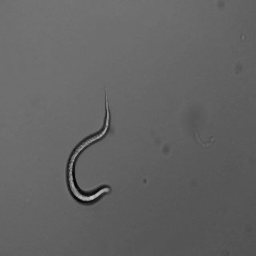

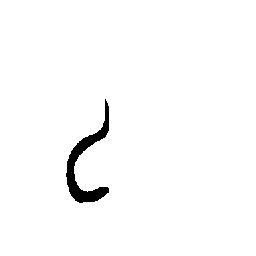

1/1 [==============================] - 0s 27ms/step


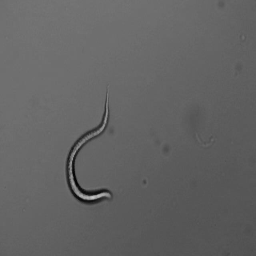

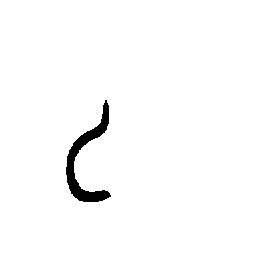

1/1 [==============================] - 0s 27ms/step


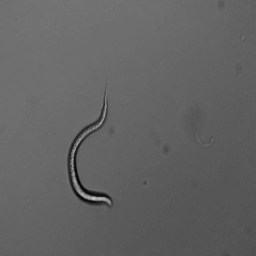

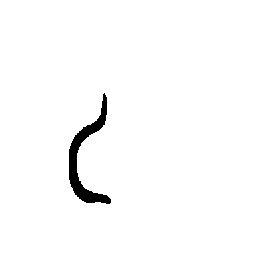

1/1 [==============================] - 0s 28ms/step


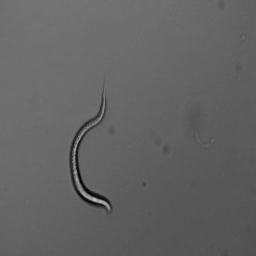

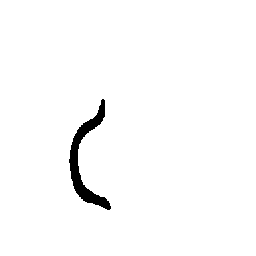

1/1 [==============================] - 0s 29ms/step


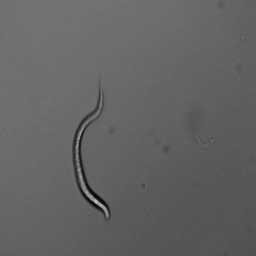

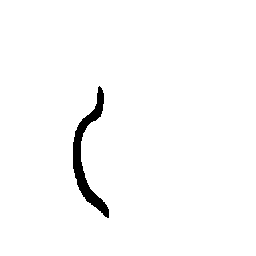

1/1 [==============================] - 0s 27ms/step


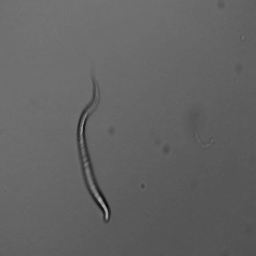

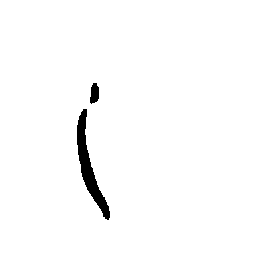

1/1 [==============================] - 0s 26ms/step


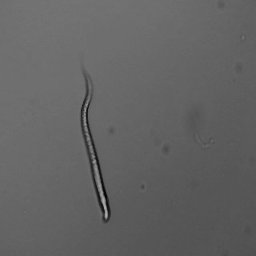

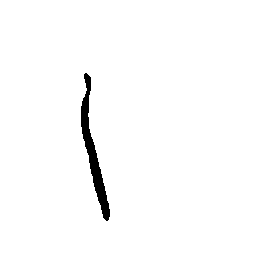

1/1 [==============================] - 0s 25ms/step


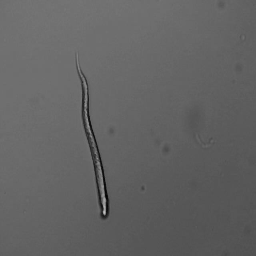

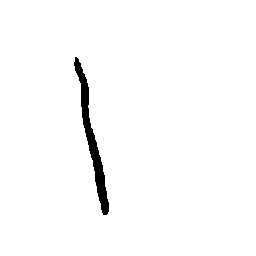

1/1 [==============================] - 0s 28ms/step


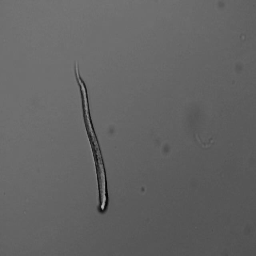

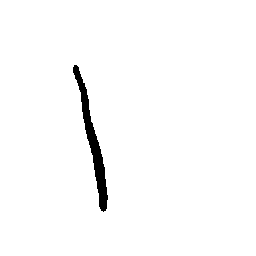

1/1 [==============================] - 0s 27ms/step


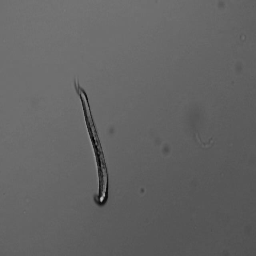

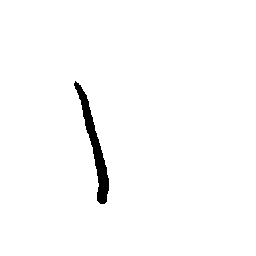

1/1 [==============================] - 0s 27ms/step


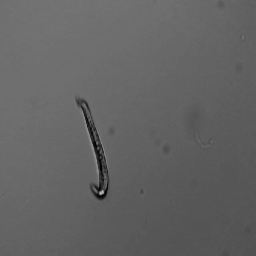

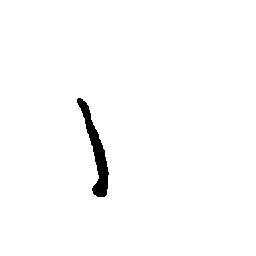

1/1 [==============================] - 0s 26ms/step


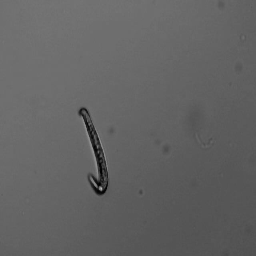

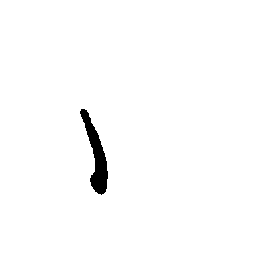

1/1 [==============================] - 0s 26ms/step


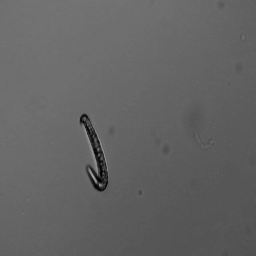

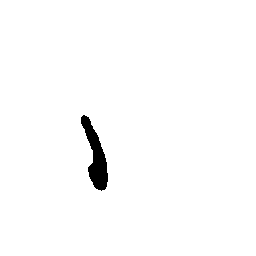

1/1 [==============================] - 0s 32ms/step


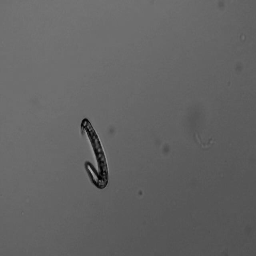

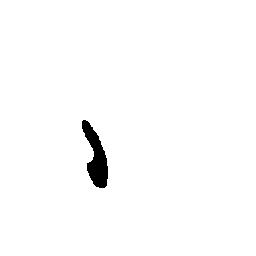

1/1 [==============================] - 0s 26ms/step


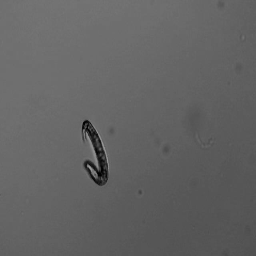

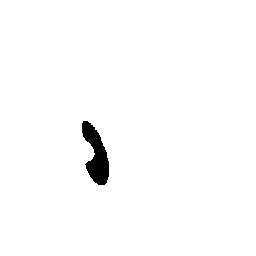

1/1 [==============================] - 0s 26ms/step


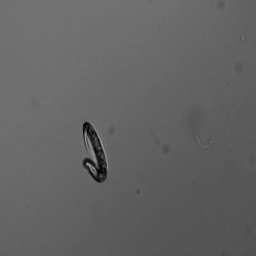

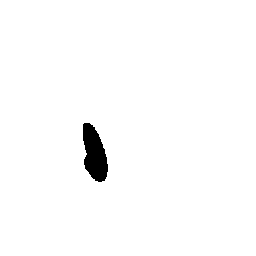

1/1 [==============================] - 0s 29ms/step


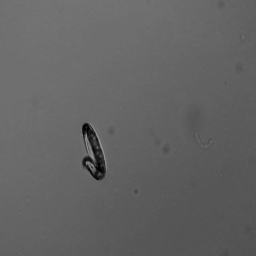

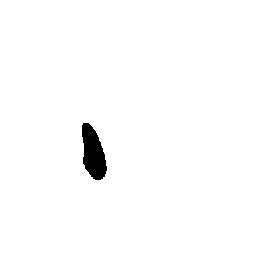

1/1 [==============================] - 0s 27ms/step


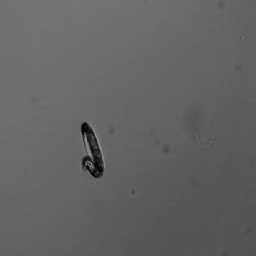

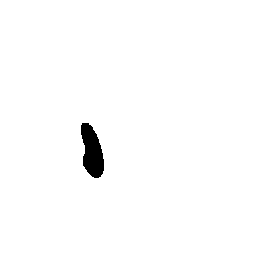

1/1 [==============================] - 0s 27ms/step


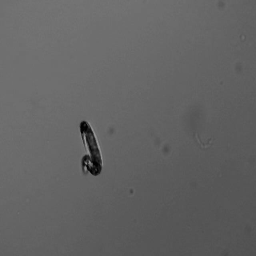

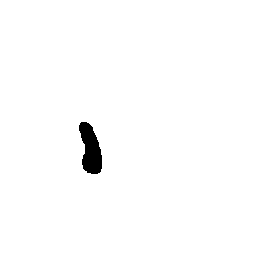

1/1 [==============================] - 0s 34ms/step


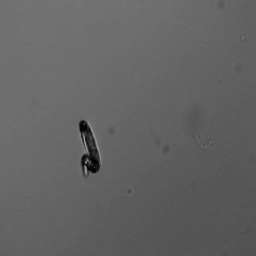

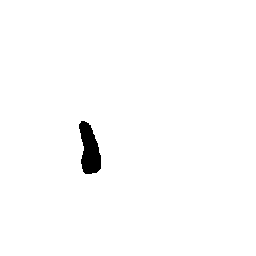

1/1 [==============================] - 0s 30ms/step


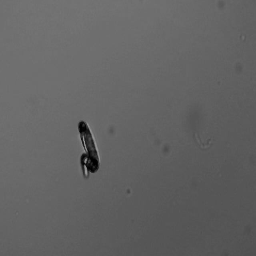

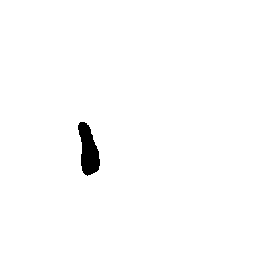

1/1 [==============================] - 0s 26ms/step


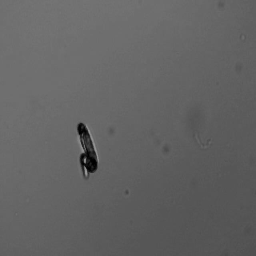

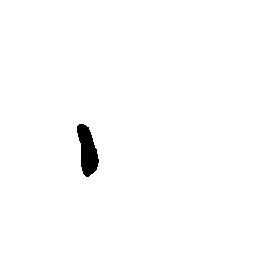

1/1 [==============================] - 0s 26ms/step


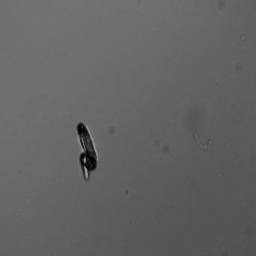

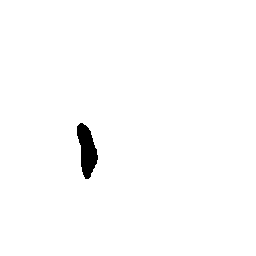

1/1 [==============================] - 0s 27ms/step


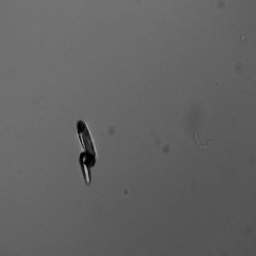

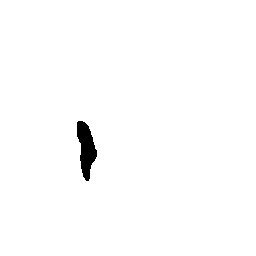

1/1 [==============================] - 0s 26ms/step


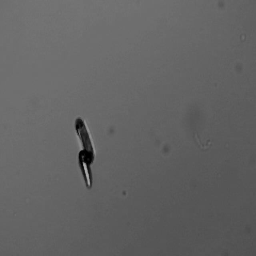

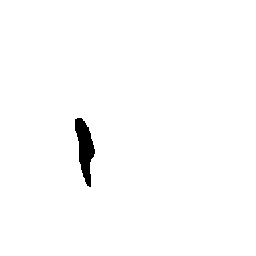

1/1 [==============================] - 0s 26ms/step


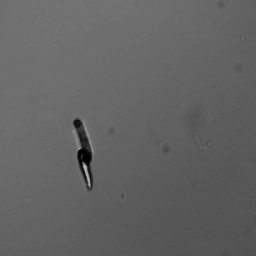

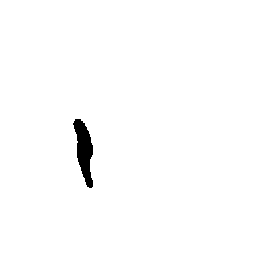

1/1 [==============================] - 0s 26ms/step


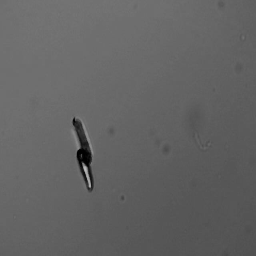

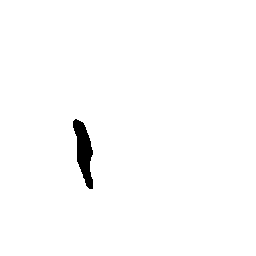

1/1 [==============================] - 0s 29ms/step


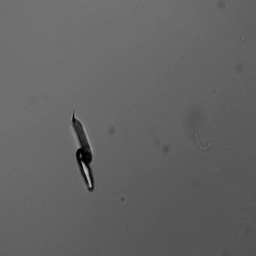

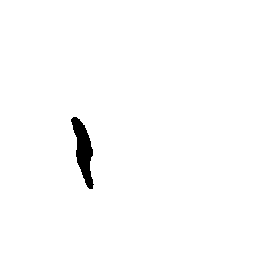

1/1 [==============================] - 0s 31ms/step


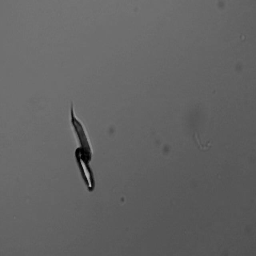

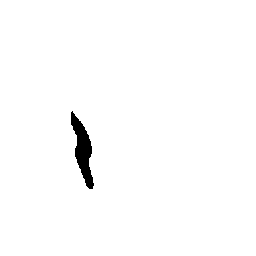

1/1 [==============================] - 0s 32ms/step


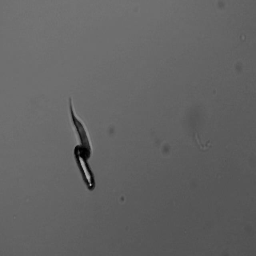

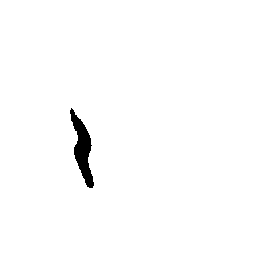

1/1 [==============================] - 0s 26ms/step


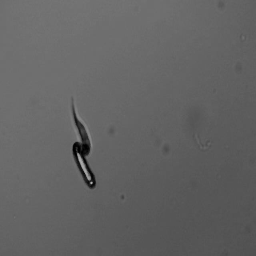

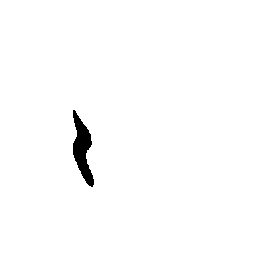

1/1 [==============================] - 0s 25ms/step


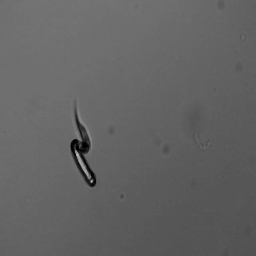

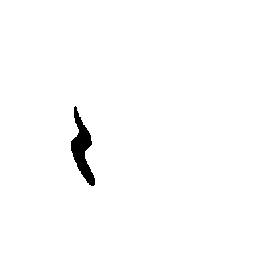

1/1 [==============================] - 0s 26ms/step


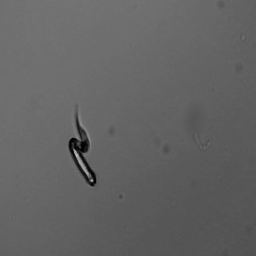

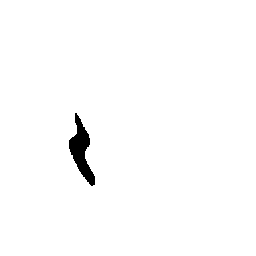

1/1 [==============================] - 0s 26ms/step


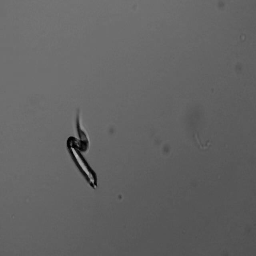

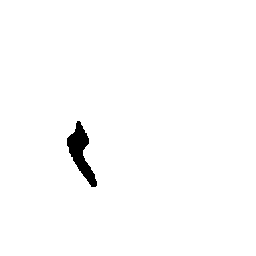

1/1 [==============================] - 0s 30ms/step


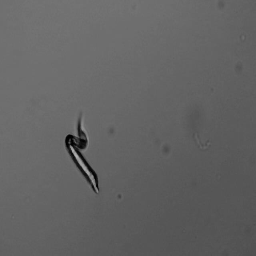

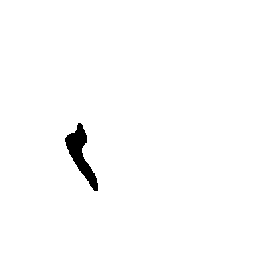

1/1 [==============================] - 0s 28ms/step


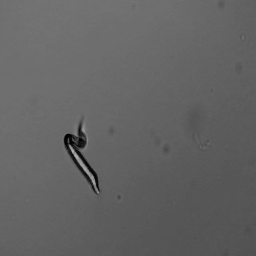

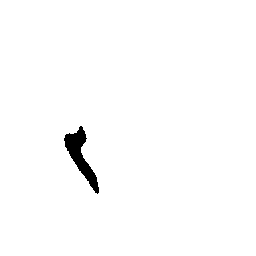

1/1 [==============================] - 0s 27ms/step


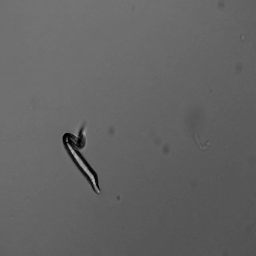

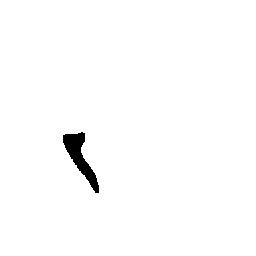

1/1 [==============================] - 0s 28ms/step


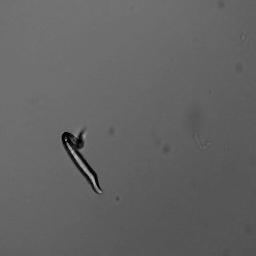

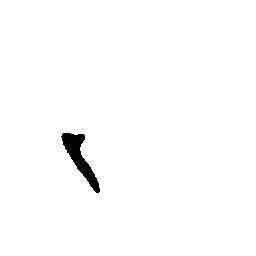

1/1 [==============================] - 0s 28ms/step


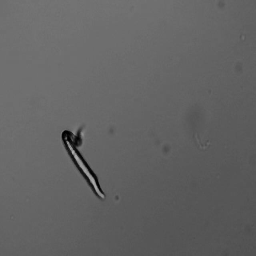

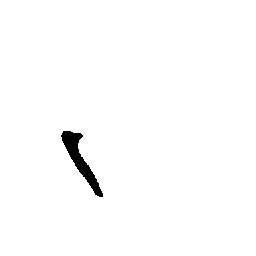

1/1 [==============================] - 0s 27ms/step


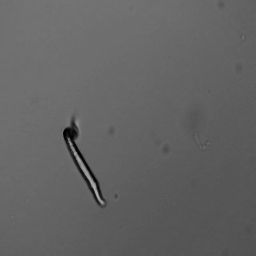

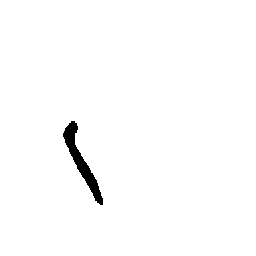

1/1 [==============================] - 0s 26ms/step


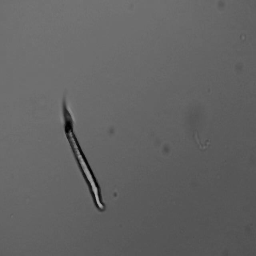

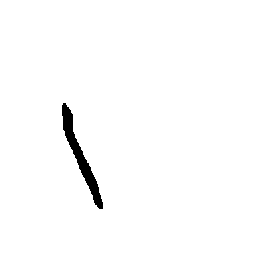

1/1 [==============================] - 0s 26ms/step


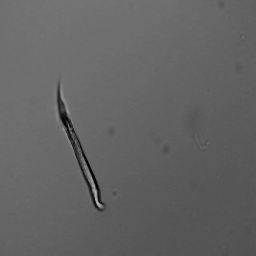

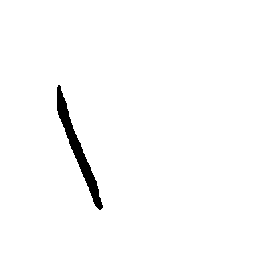

1/1 [==============================] - 0s 28ms/step


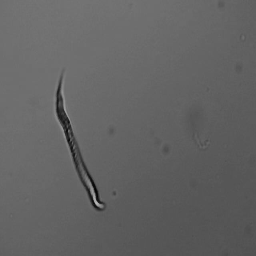

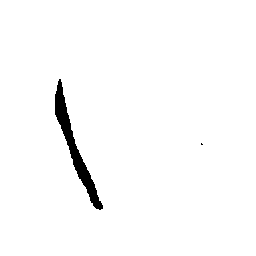

1/1 [==============================] - 0s 27ms/step


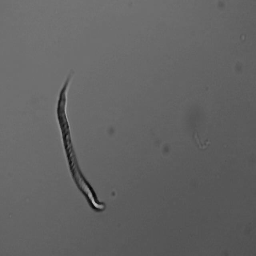

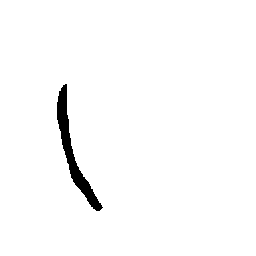

1/1 [==============================] - 0s 29ms/step


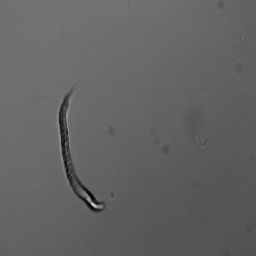

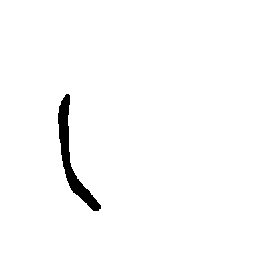

1/1 [==============================] - 0s 30ms/step


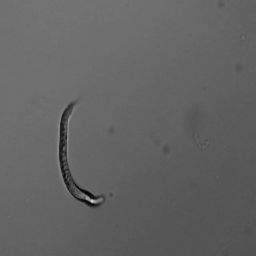

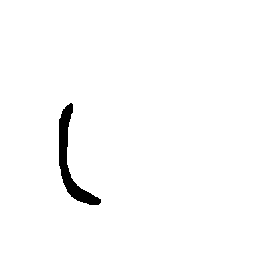

1/1 [==============================] - 0s 29ms/step


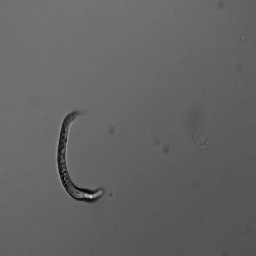

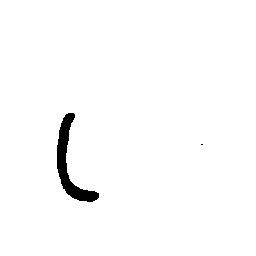

1/1 [==============================] - 0s 27ms/step


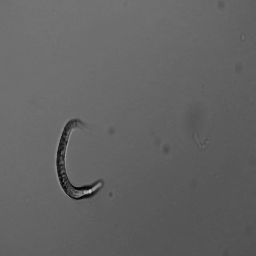

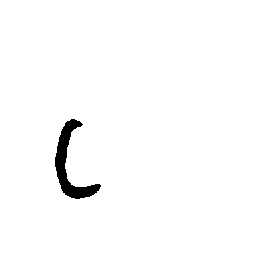

1/1 [==============================] - 0s 27ms/step


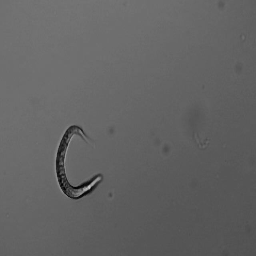

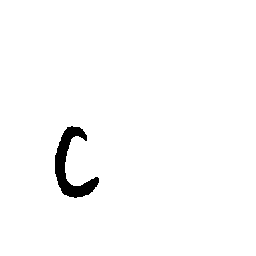

1/1 [==============================] - 0s 27ms/step


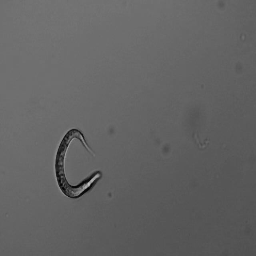

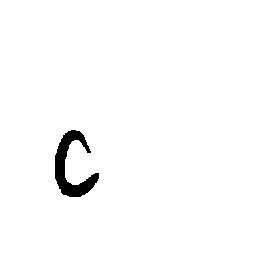

1/1 [==============================] - 0s 26ms/step


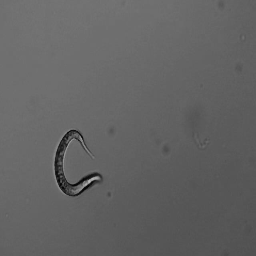

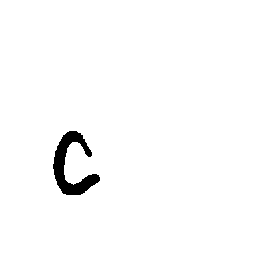

1/1 [==============================] - 0s 27ms/step


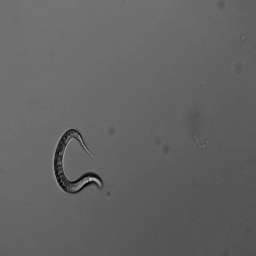

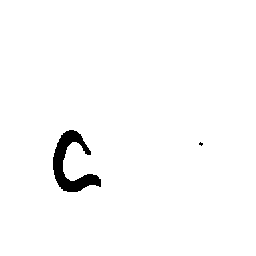

1/1 [==============================] - 0s 33ms/step


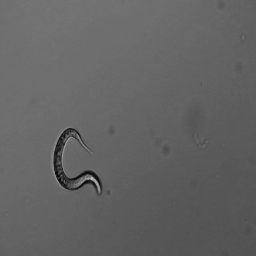

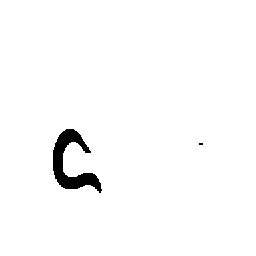

1/1 [==============================] - 0s 33ms/step


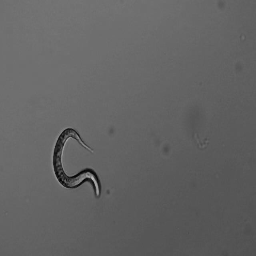

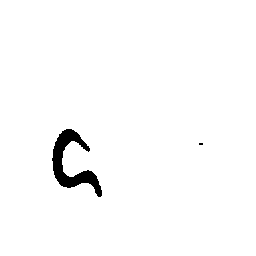

1/1 [==============================] - 0s 31ms/step


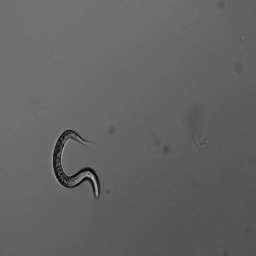

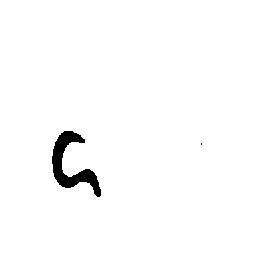

1/1 [==============================] - 0s 30ms/step


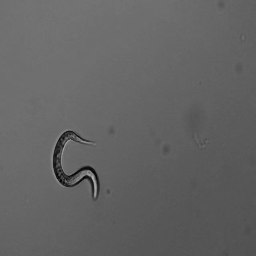

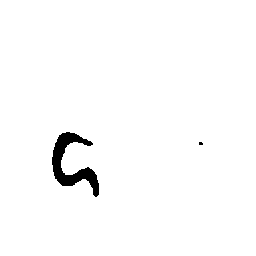

1/1 [==============================] - 0s 33ms/step


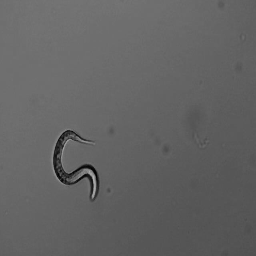

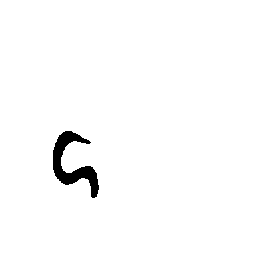

1/1 [==============================] - 0s 26ms/step


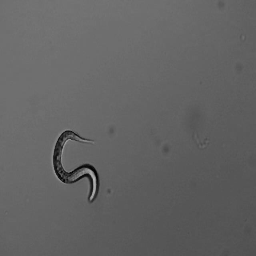

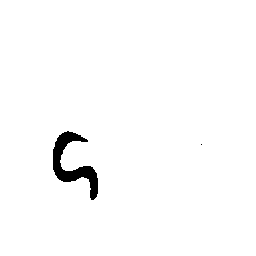

1/1 [==============================] - 0s 29ms/step


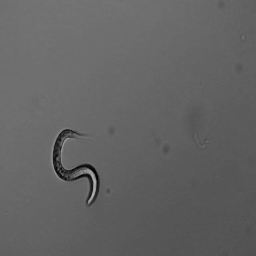

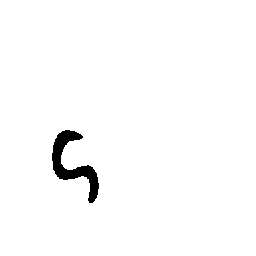

1/1 [==============================] - 0s 29ms/step


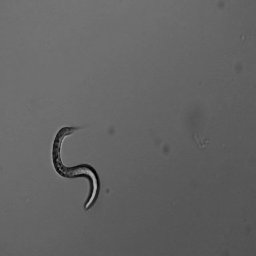

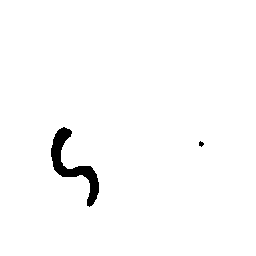

1/1 [==============================] - 0s 28ms/step


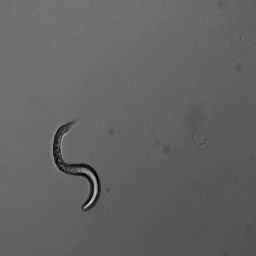

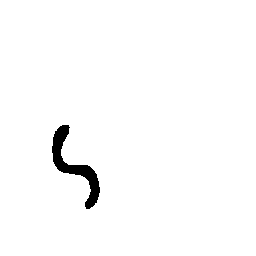

1/1 [==============================] - 0s 26ms/step


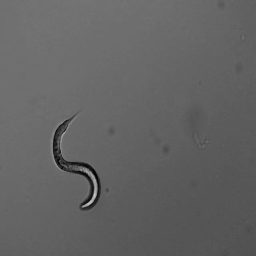

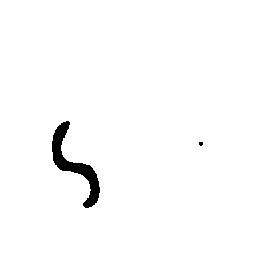

1/1 [==============================] - 0s 27ms/step


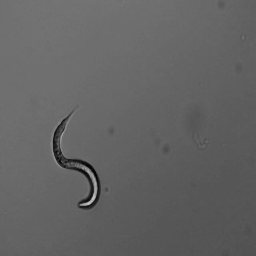

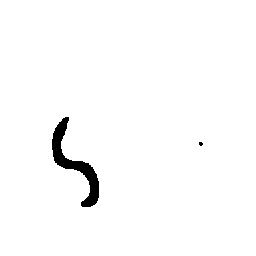

1/1 [==============================] - 0s 30ms/step


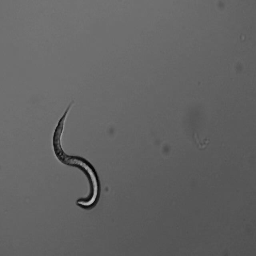

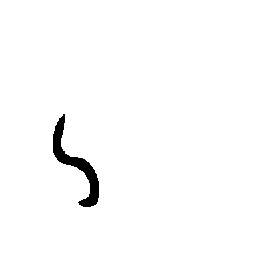

1/1 [==============================] - 0s 32ms/step


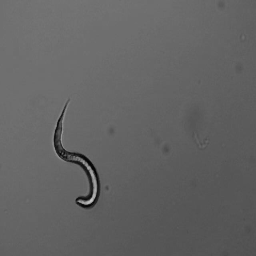

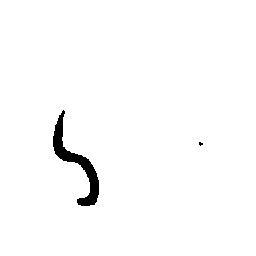

1/1 [==============================] - 0s 27ms/step


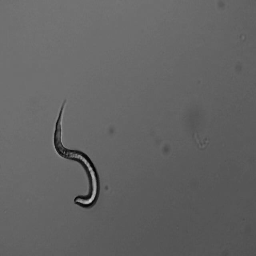

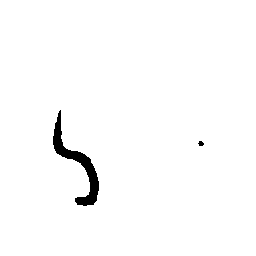

1/1 [==============================] - 0s 27ms/step


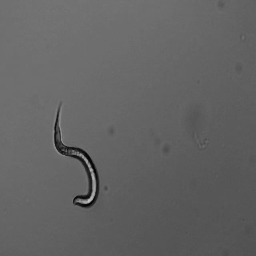

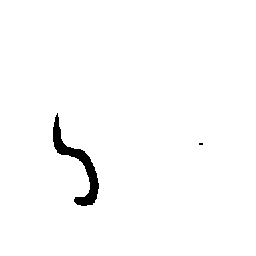

1/1 [==============================] - 0s 26ms/step


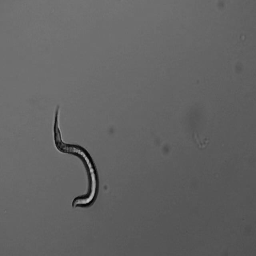

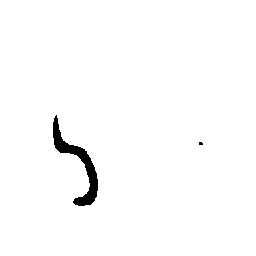

1/1 [==============================] - 0s 27ms/step


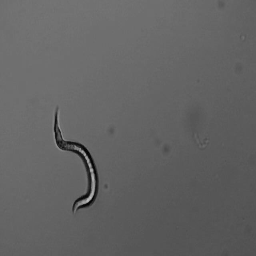

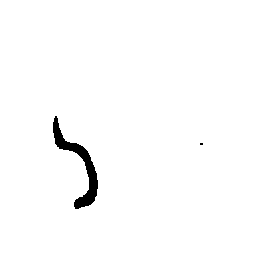

1/1 [==============================] - 0s 28ms/step


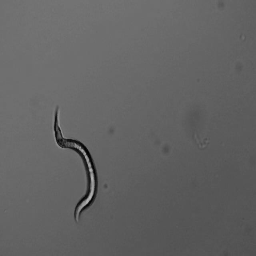

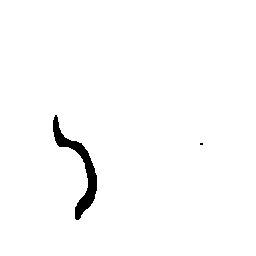

1/1 [==============================] - 0s 27ms/step


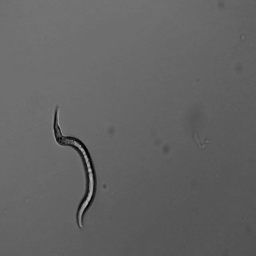

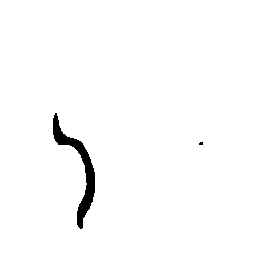

1/1 [==============================] - 0s 29ms/step


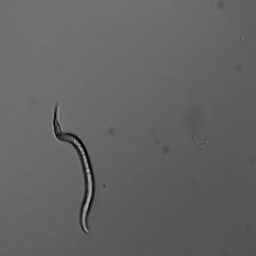

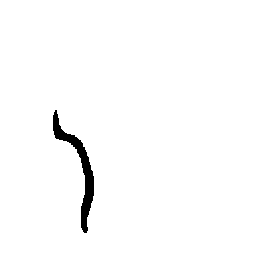

1/1 [==============================] - 0s 29ms/step


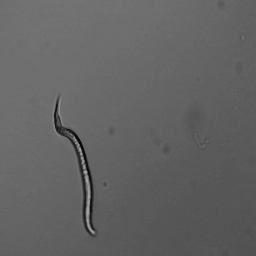

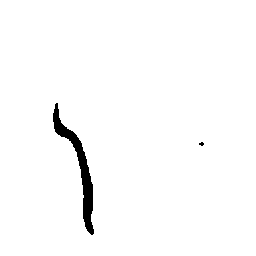

1/1 [==============================] - 0s 31ms/step


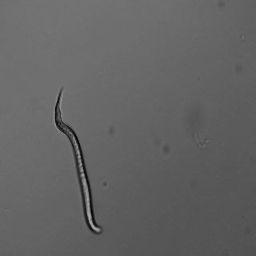

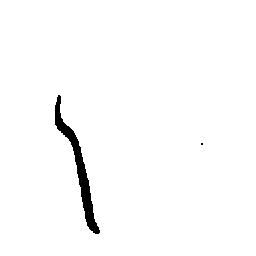

1/1 [==============================] - 0s 30ms/step


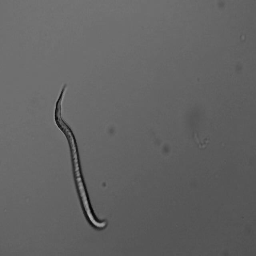

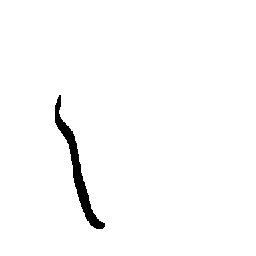

1/1 [==============================] - 0s 31ms/step


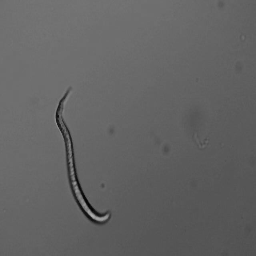

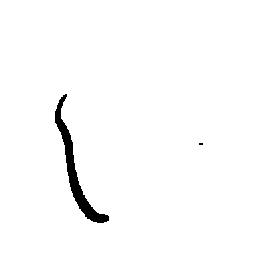

1/1 [==============================] - 0s 30ms/step


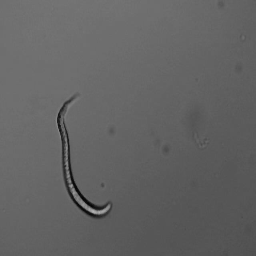

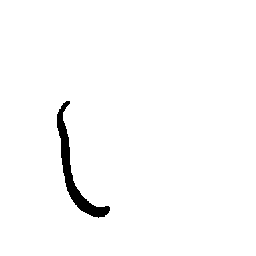

1/1 [==============================] - 0s 27ms/step


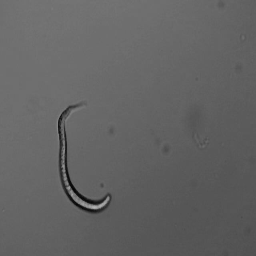

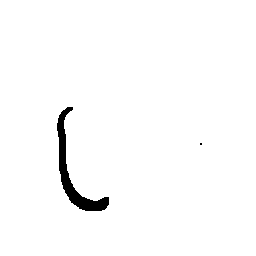

1/1 [==============================] - 0s 27ms/step


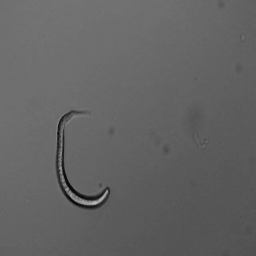

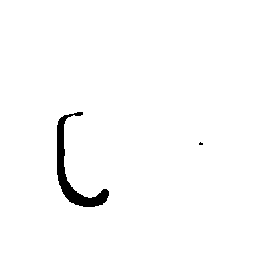

1/1 [==============================] - 0s 28ms/step


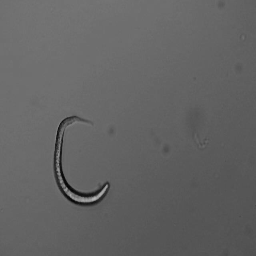

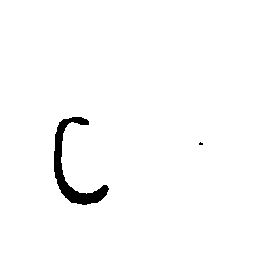

1/1 [==============================] - 0s 28ms/step


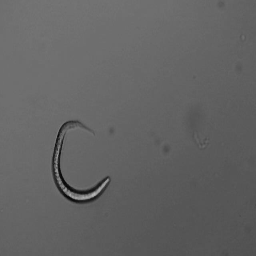

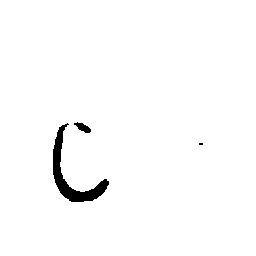

1/1 [==============================] - 0s 27ms/step


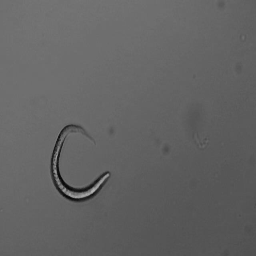

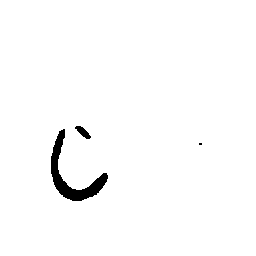

1/1 [==============================] - 0s 32ms/step


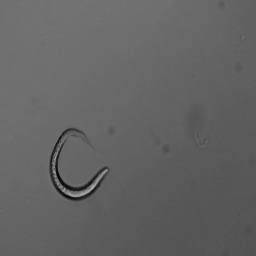

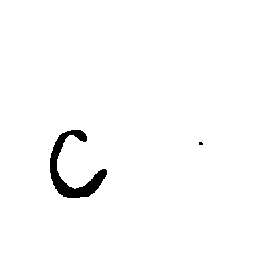

1/1 [==============================] - 0s 43ms/step


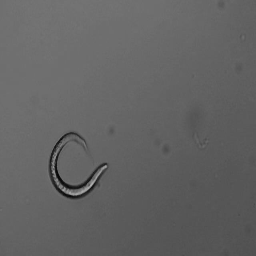

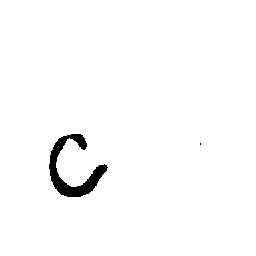

1/1 [==============================] - 0s 30ms/step


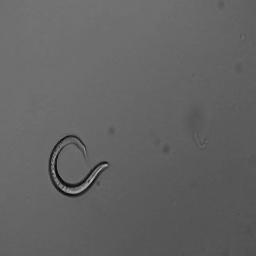

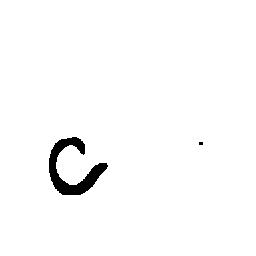

1/1 [==============================] - 0s 33ms/step


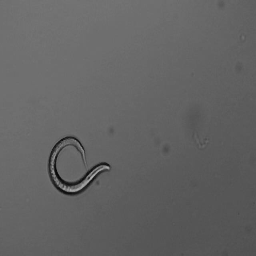

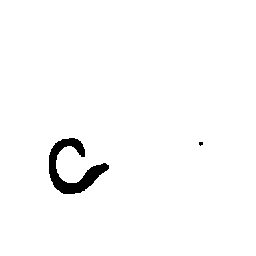

1/1 [==============================] - 0s 43ms/step


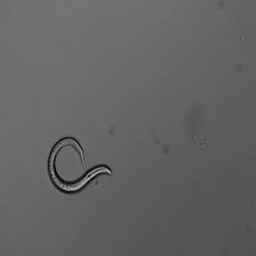

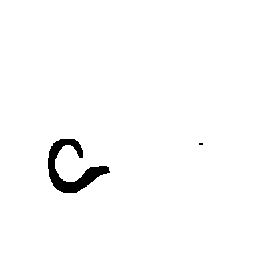

1/1 [==============================] - 0s 27ms/step


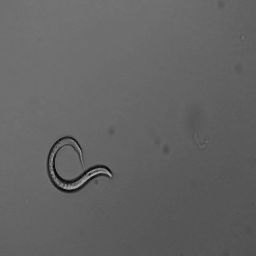

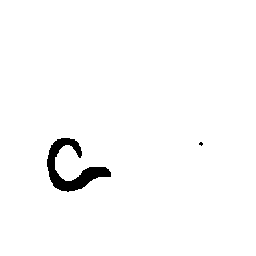

1/1 [==============================] - 0s 28ms/step


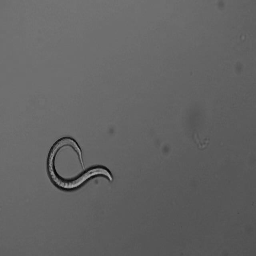

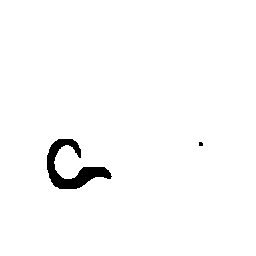

1/1 [==============================] - 0s 27ms/step


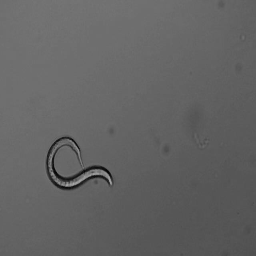

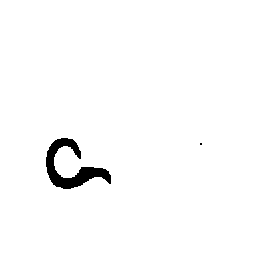

1/1 [==============================] - 0s 28ms/step


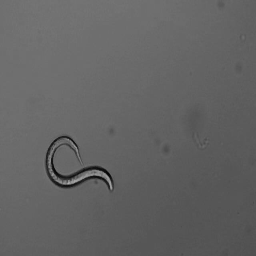

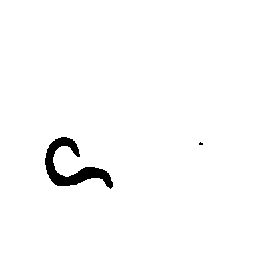

1/1 [==============================] - 0s 28ms/step


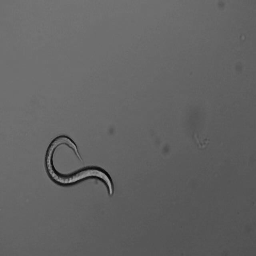

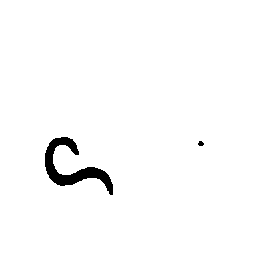

1/1 [==============================] - 0s 29ms/step


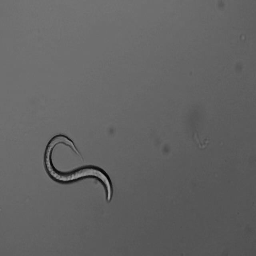

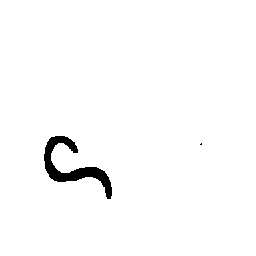

1/1 [==============================] - 0s 27ms/step


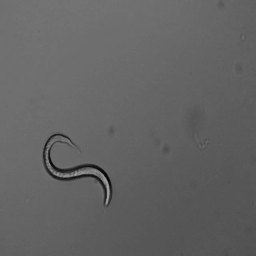

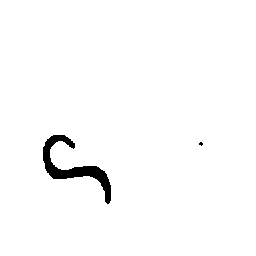

1/1 [==============================] - 0s 39ms/step


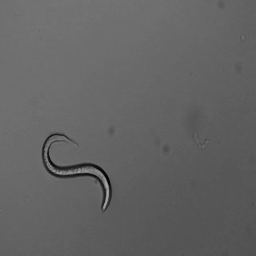

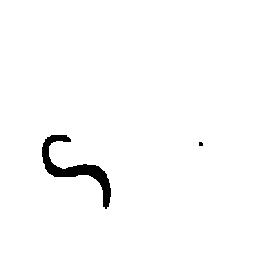

1/1 [==============================] - 0s 27ms/step


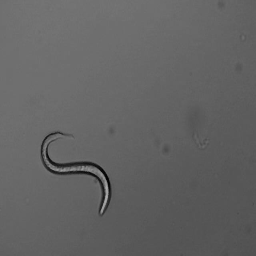

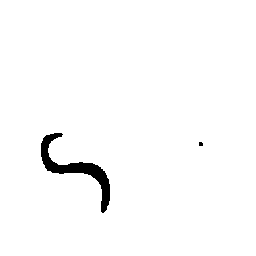

1/1 [==============================] - 0s 28ms/step


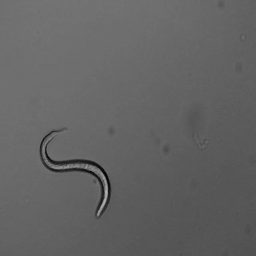

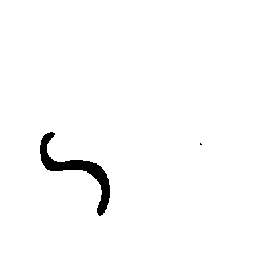

1/1 [==============================] - 0s 27ms/step


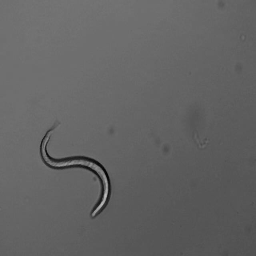

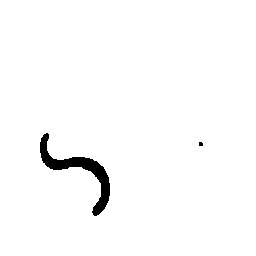

1/1 [==============================] - 0s 26ms/step


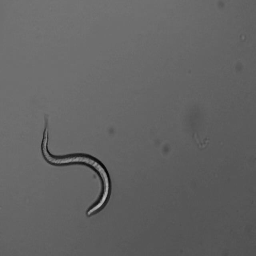

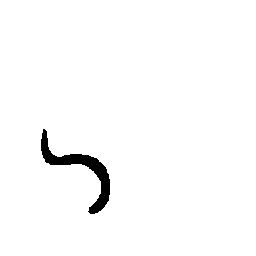

1/1 [==============================] - 0s 27ms/step


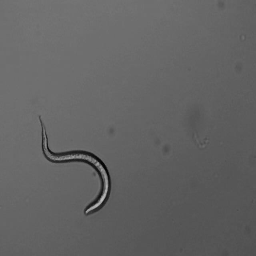

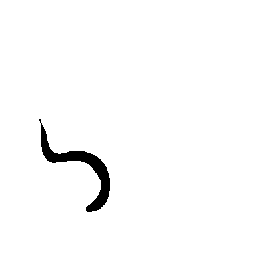

1/1 [==============================] - 0s 28ms/step


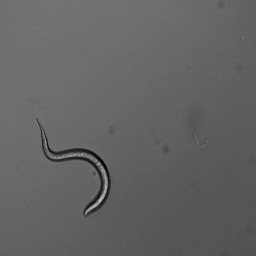

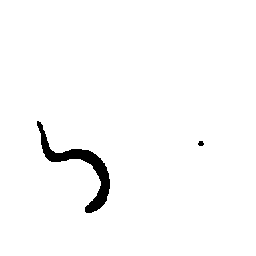

1/1 [==============================] - 0s 30ms/step


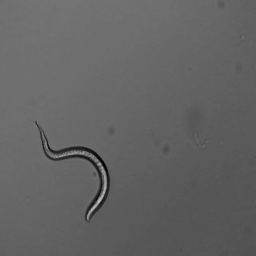

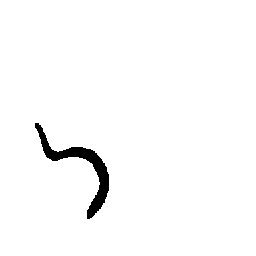

1/1 [==============================] - 0s 56ms/step


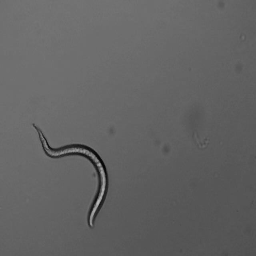

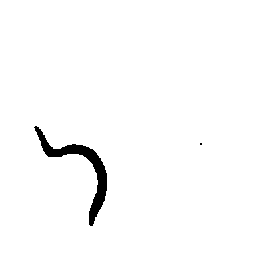

1/1 [==============================] - 0s 44ms/step


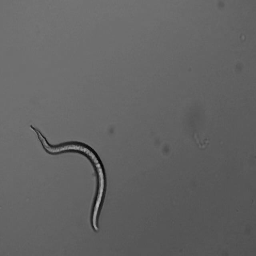

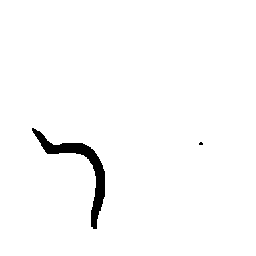

1/1 [==============================] - 0s 34ms/step


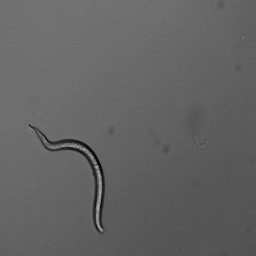

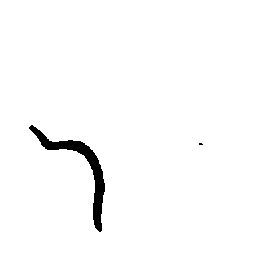

1/1 [==============================] - 0s 34ms/step


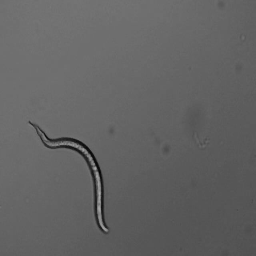

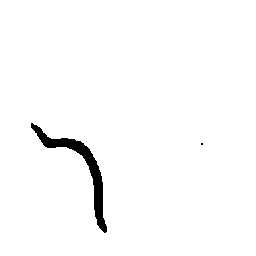

1/1 [==============================] - 0s 40ms/step


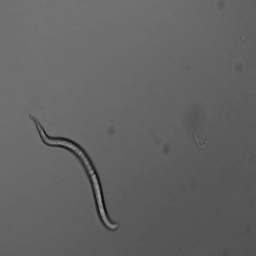

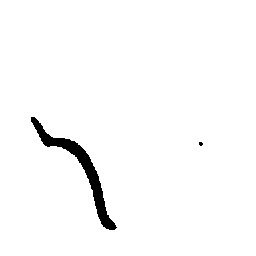

1/1 [==============================] - 0s 40ms/step


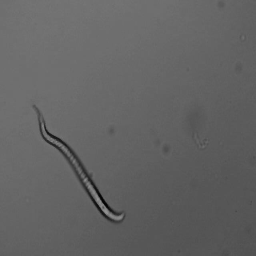

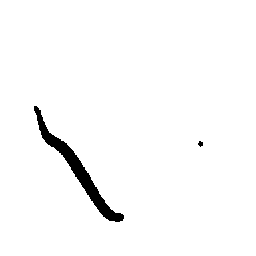

1/1 [==============================] - 0s 40ms/step


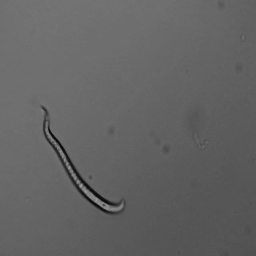

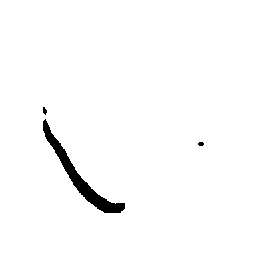

1/1 [==============================] - 0s 43ms/step


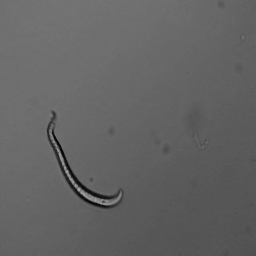

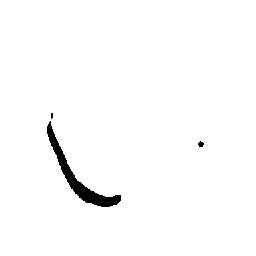

1/1 [==============================] - 0s 65ms/step


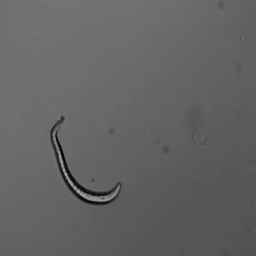

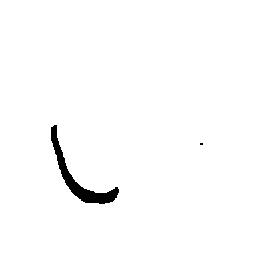

1/1 [==============================] - 0s 31ms/step


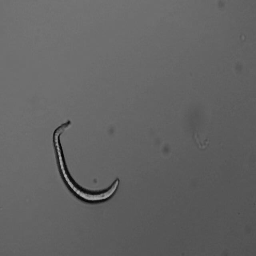

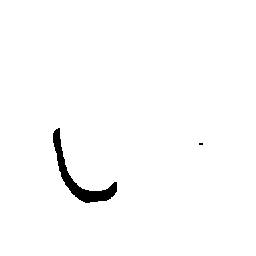

1/1 [==============================] - 0s 59ms/step


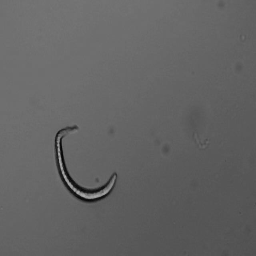

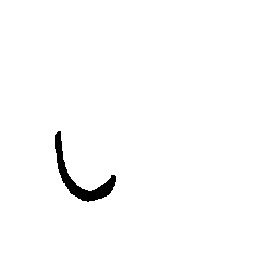

1/1 [==============================] - 0s 34ms/step


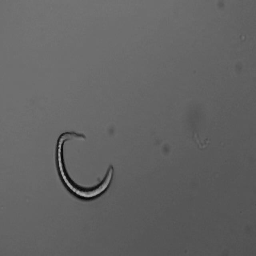

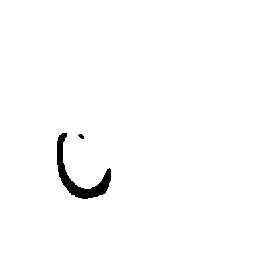

1/1 [==============================] - 0s 45ms/step


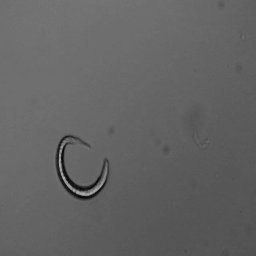

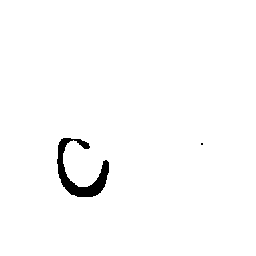

1/1 [==============================] - 0s 39ms/step


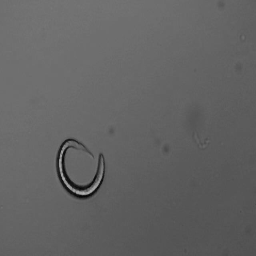

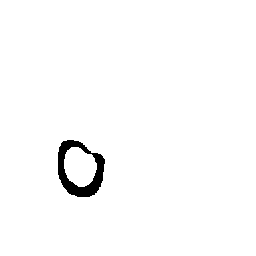

1/1 [==============================] - 0s 53ms/step


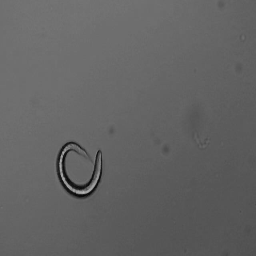

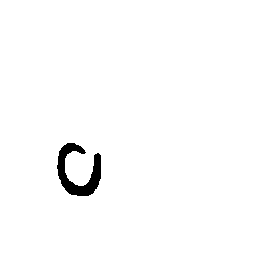

1/1 [==============================] - 0s 33ms/step


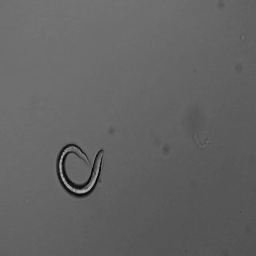

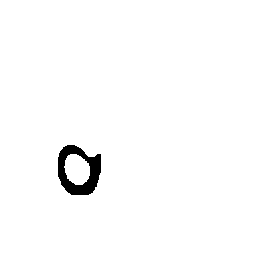

1/1 [==============================] - 0s 58ms/step


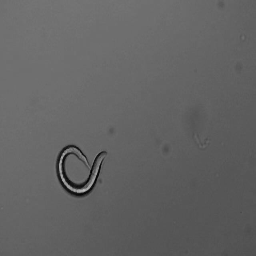

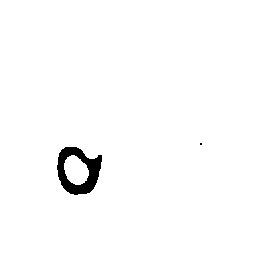

1/1 [==============================] - 0s 29ms/step


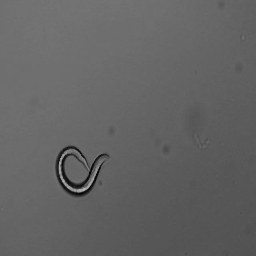

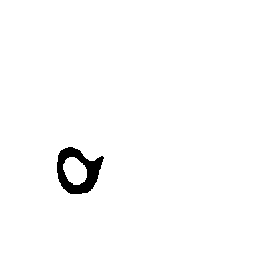

1/1 [==============================] - 0s 26ms/step


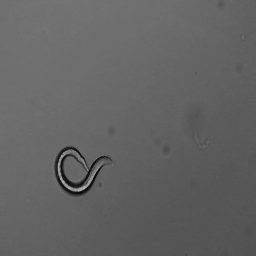

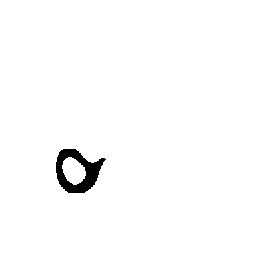

1/1 [==============================] - 0s 27ms/step


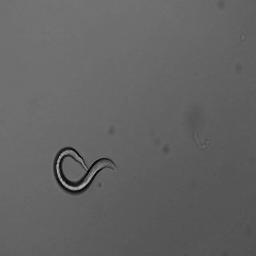

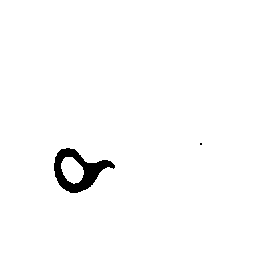

1/1 [==============================] - 0s 29ms/step


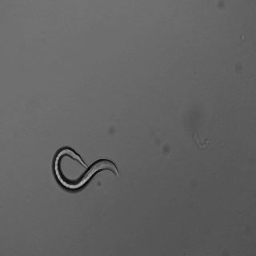

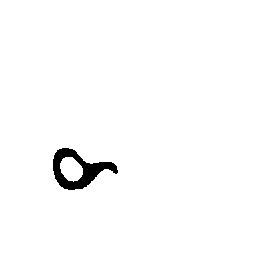

1/1 [==============================] - 0s 27ms/step


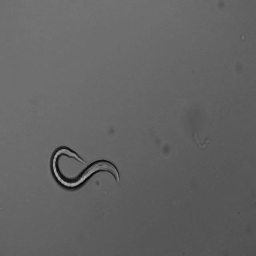

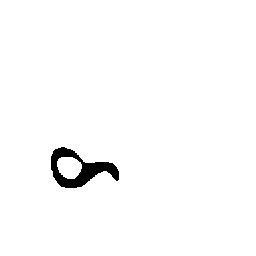

1/1 [==============================] - 0s 25ms/step


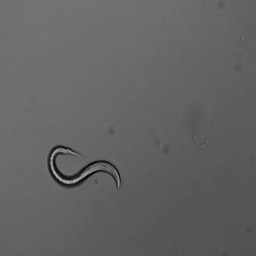

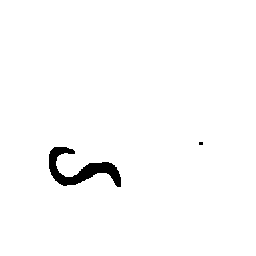

1/1 [==============================] - 0s 36ms/step


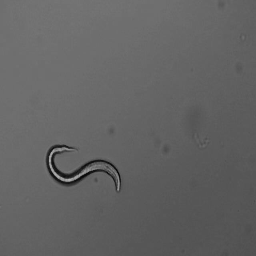

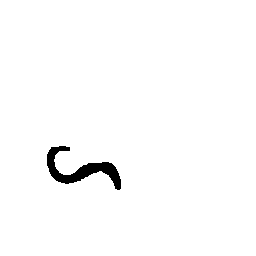

1/1 [==============================] - 0s 30ms/step


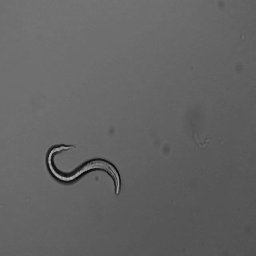

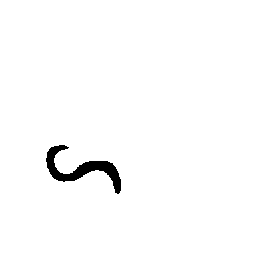

1/1 [==============================] - 0s 28ms/step


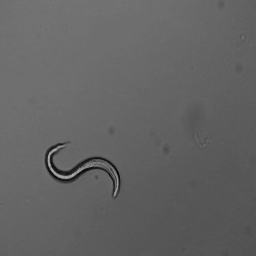

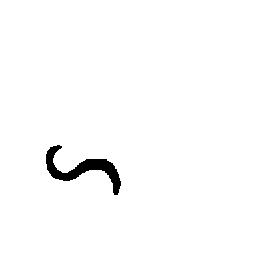

1/1 [==============================] - 0s 30ms/step


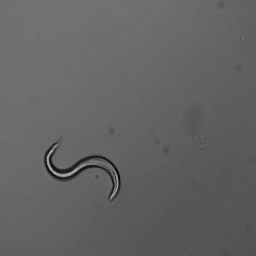

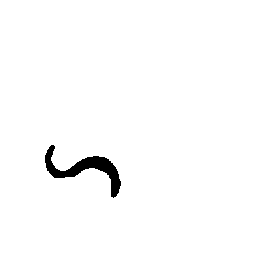

1/1 [==============================] - 0s 26ms/step


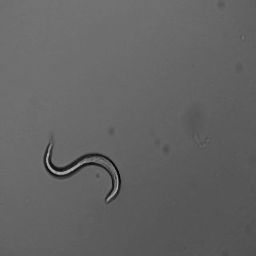

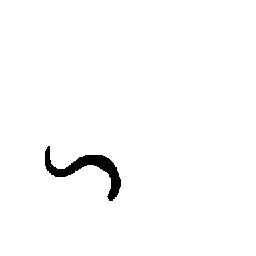

1/1 [==============================] - 0s 26ms/step


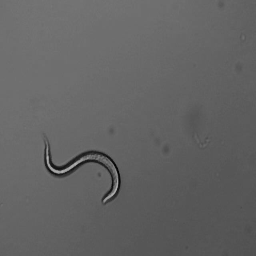

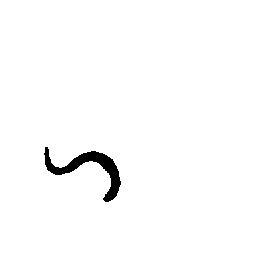

1/1 [==============================] - 0s 30ms/step


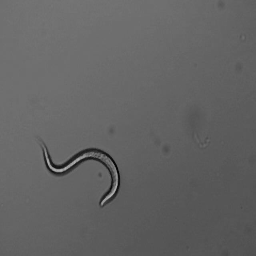

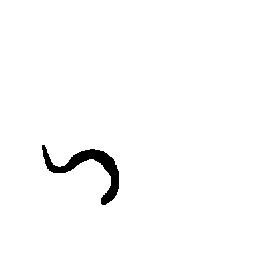

1/1 [==============================] - 0s 27ms/step


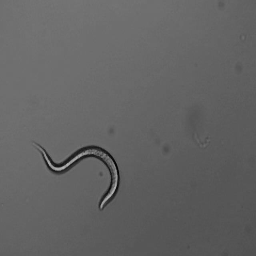

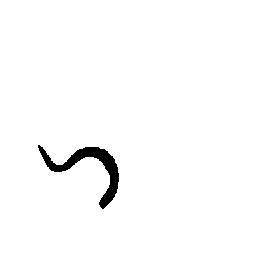

1/1 [==============================] - 0s 28ms/step


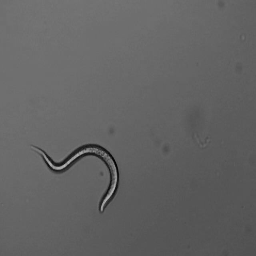

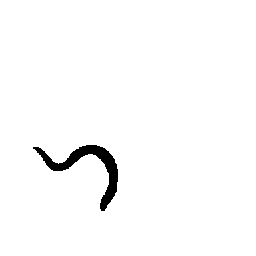

1/1 [==============================] - 0s 26ms/step


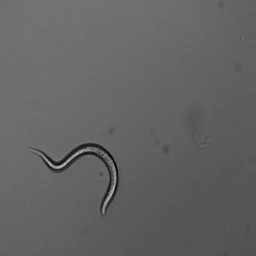

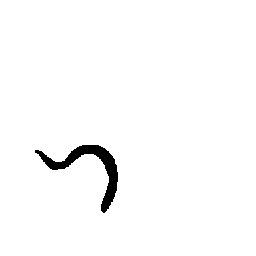

1/1 [==============================] - 0s 35ms/step


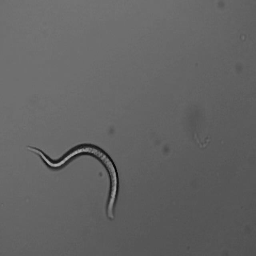

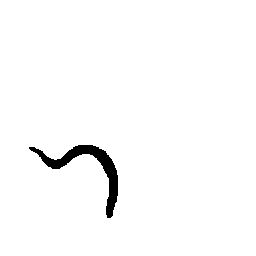

1/1 [==============================] - 0s 30ms/step


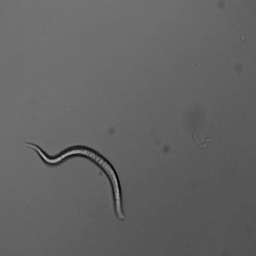

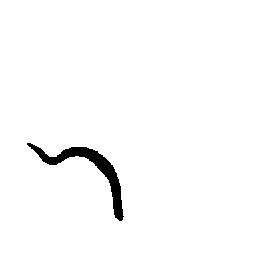

1/1 [==============================] - 0s 32ms/step


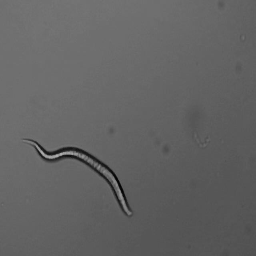

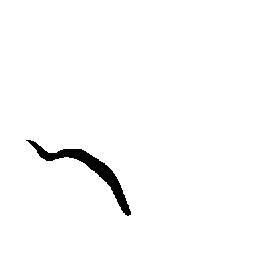

1/1 [==============================] - 0s 28ms/step


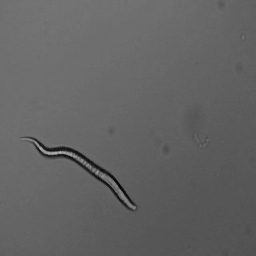

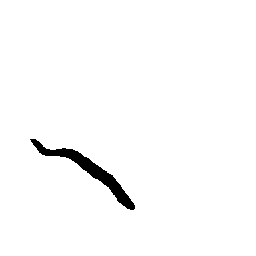

1/1 [==============================] - 0s 26ms/step


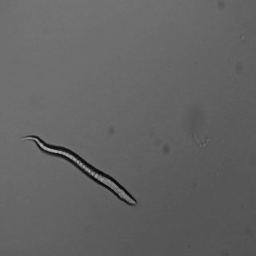

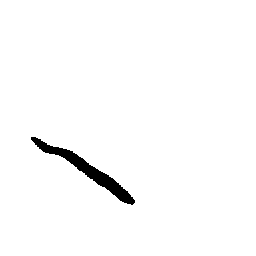

1/1 [==============================] - 0s 26ms/step


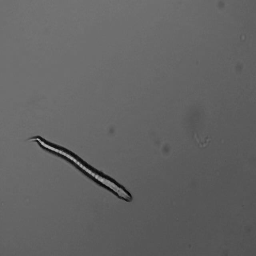

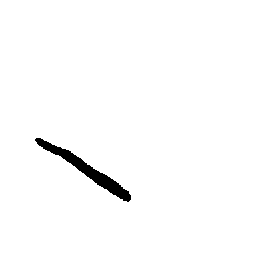

1/1 [==============================] - 0s 29ms/step


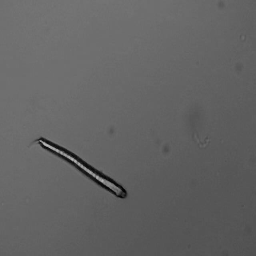

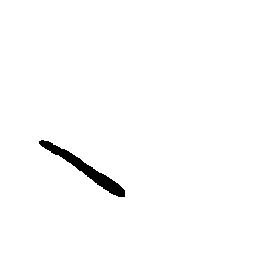

1/1 [==============================] - 0s 27ms/step


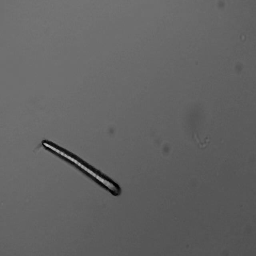

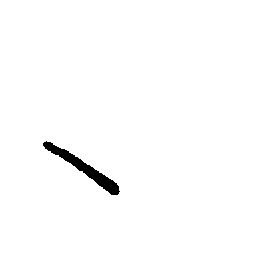

1/1 [==============================] - 0s 32ms/step


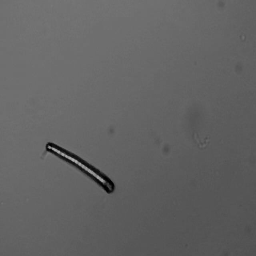

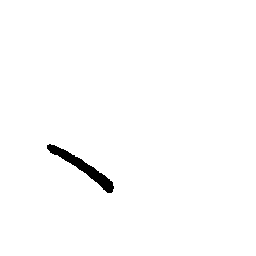

1/1 [==============================] - 0s 29ms/step


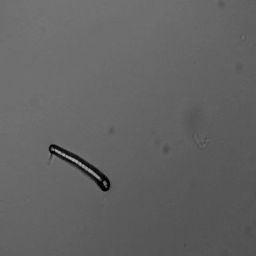

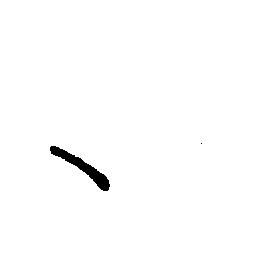

1/1 [==============================] - 0s 29ms/step


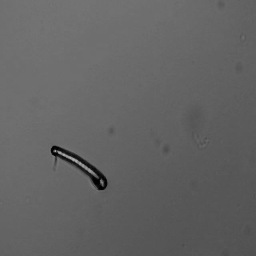

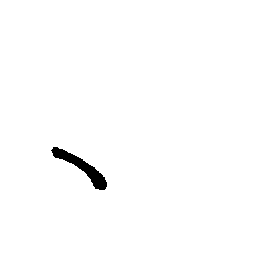

1/1 [==============================] - 0s 30ms/step


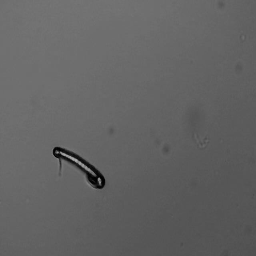

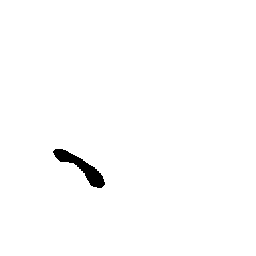

1/1 [==============================] - 0s 31ms/step


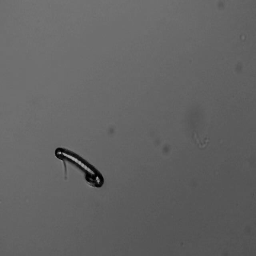

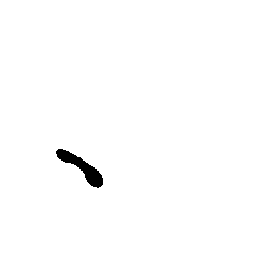

1/1 [==============================] - 0s 30ms/step


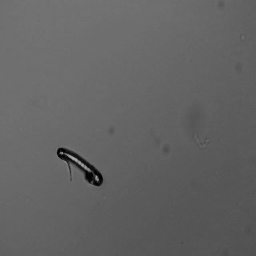

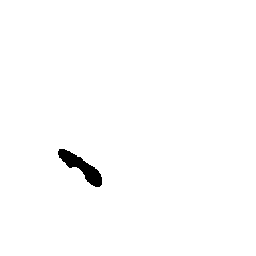

1/1 [==============================] - 0s 27ms/step


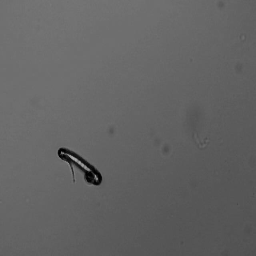

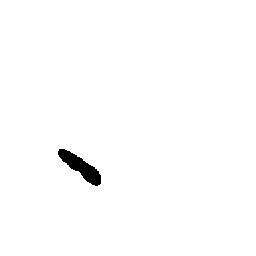

1/1 [==============================] - 0s 32ms/step


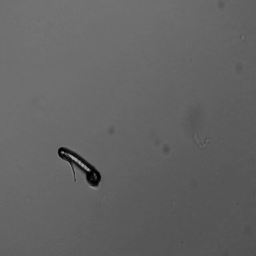

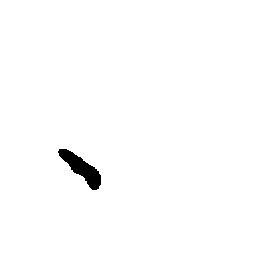

1/1 [==============================] - 0s 26ms/step


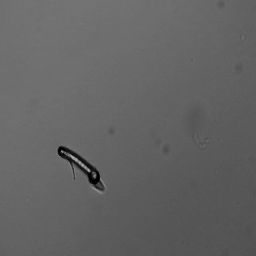

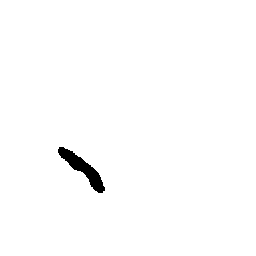

1/1 [==============================] - 0s 32ms/step


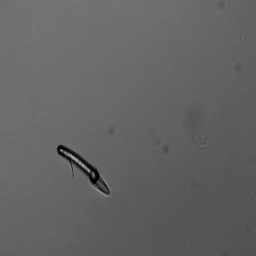

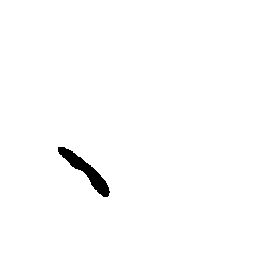

1/1 [==============================] - 0s 29ms/step


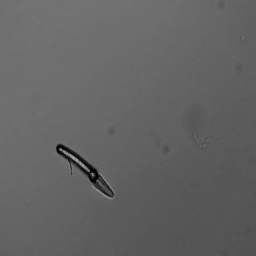

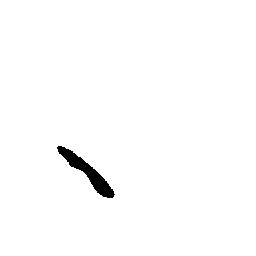

1/1 [==============================] - 0s 28ms/step


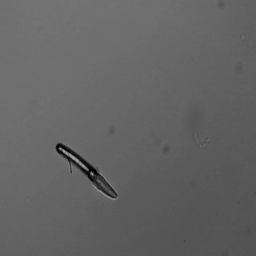

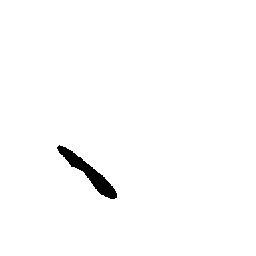

1/1 [==============================] - 0s 28ms/step


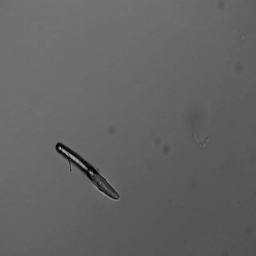

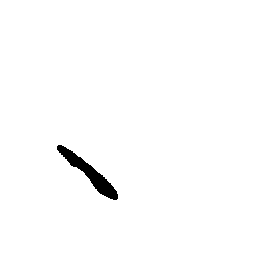

1/1 [==============================] - 0s 39ms/step


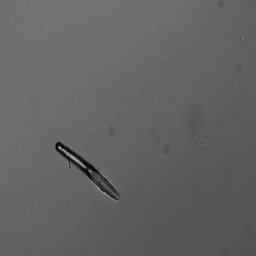

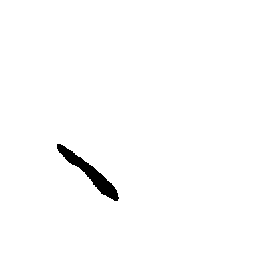

1/1 [==============================] - 0s 26ms/step


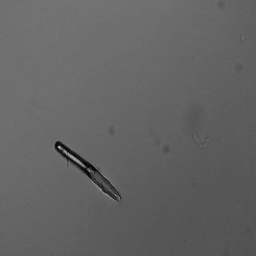

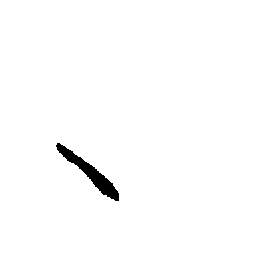

1/1 [==============================] - 0s 27ms/step


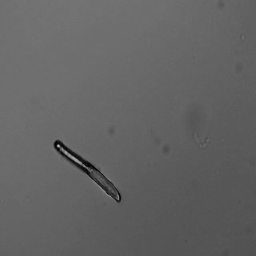

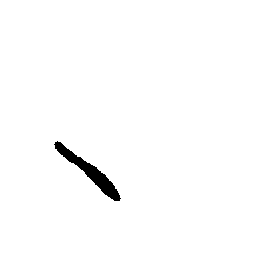

1/1 [==============================] - 0s 31ms/step


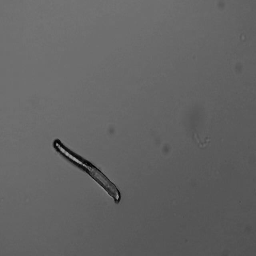

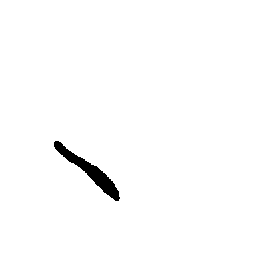

1/1 [==============================] - 0s 29ms/step


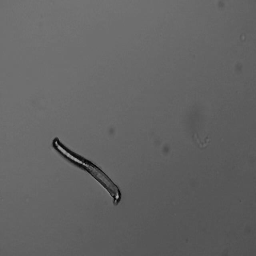

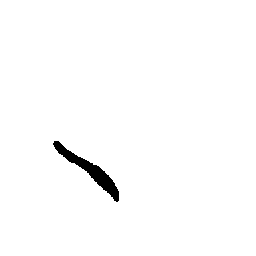

1/1 [==============================] - 0s 27ms/step


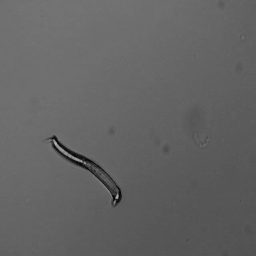

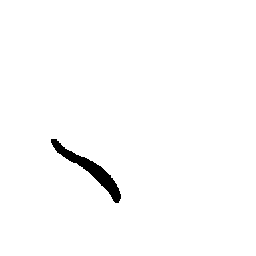

1/1 [==============================] - 0s 28ms/step


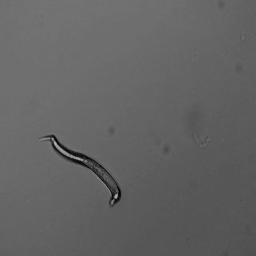

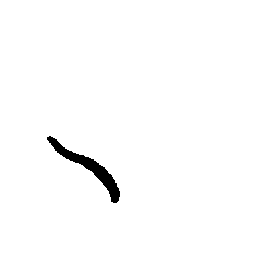

1/1 [==============================] - 0s 27ms/step


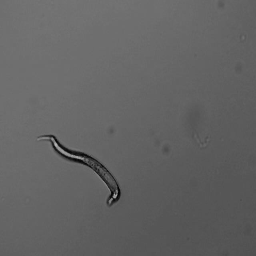

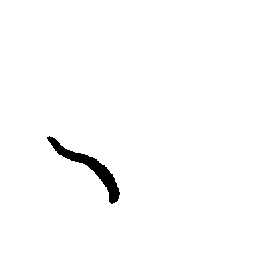

1/1 [==============================] - 0s 26ms/step


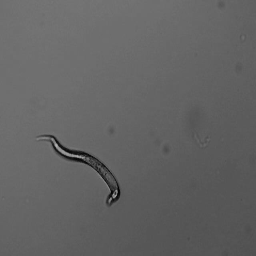

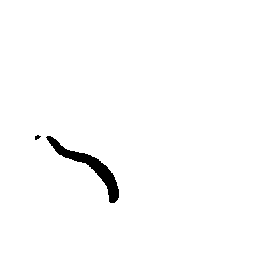

1/1 [==============================] - 0s 27ms/step


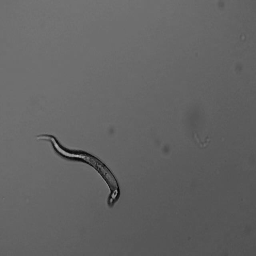

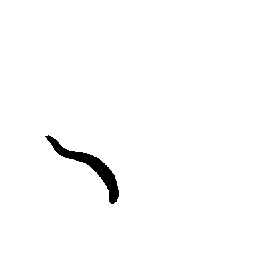

1/1 [==============================] - 0s 28ms/step


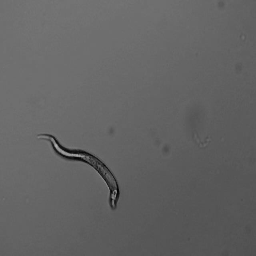

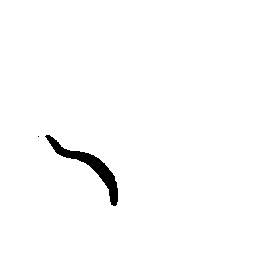

1/1 [==============================] - 0s 28ms/step


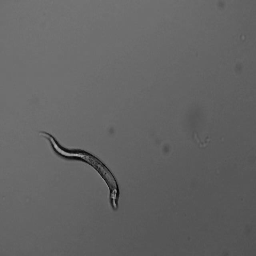

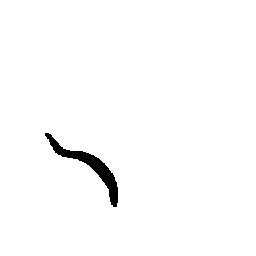

1/1 [==============================] - 0s 27ms/step


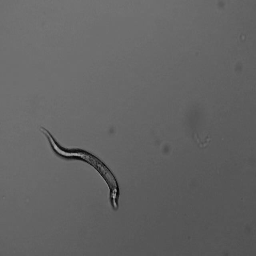

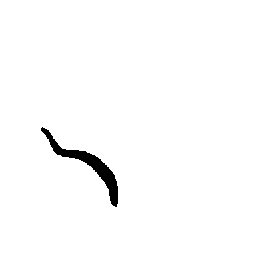

1/1 [==============================] - 0s 27ms/step


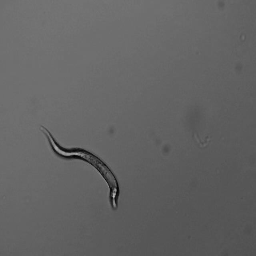

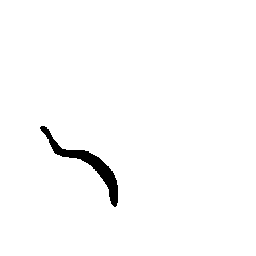

1/1 [==============================] - 0s 29ms/step


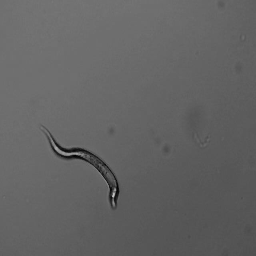

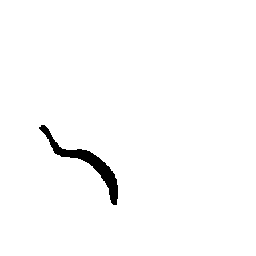

1/1 [==============================] - 0s 29ms/step


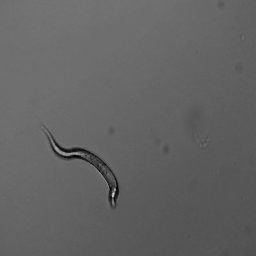

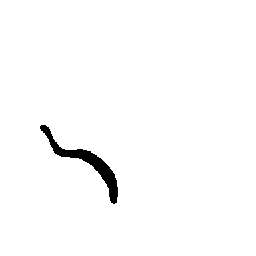

1/1 [==============================] - 0s 28ms/step


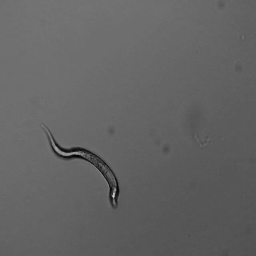

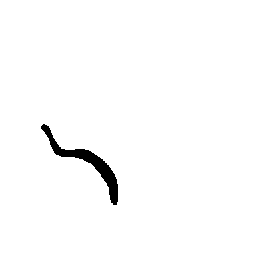

1/1 [==============================] - 0s 27ms/step


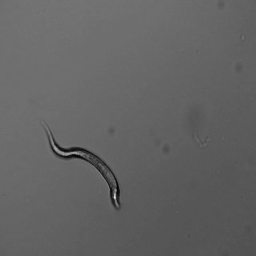

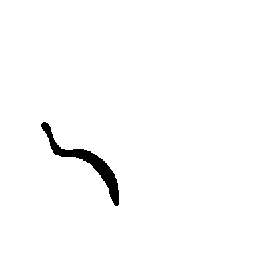

1/1 [==============================] - 0s 26ms/step


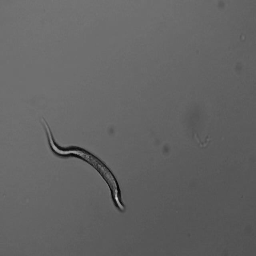

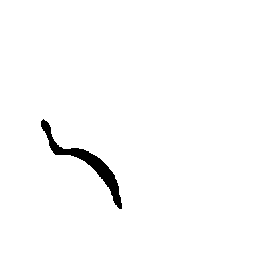

1/1 [==============================] - 0s 27ms/step


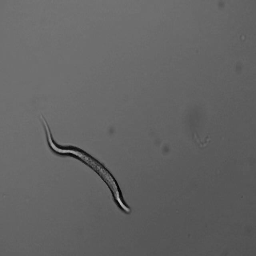

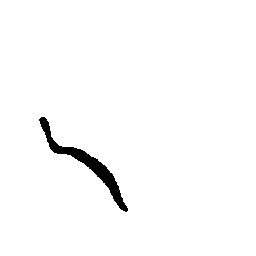

1/1 [==============================] - 0s 27ms/step


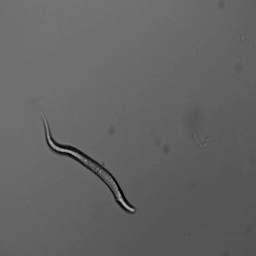

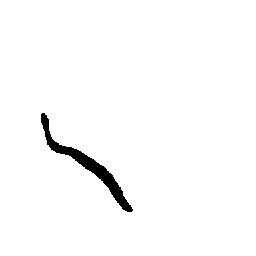

1/1 [==============================] - 0s 26ms/step


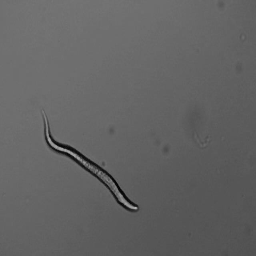

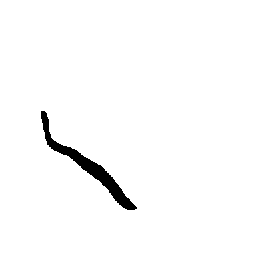

1/1 [==============================] - 0s 28ms/step


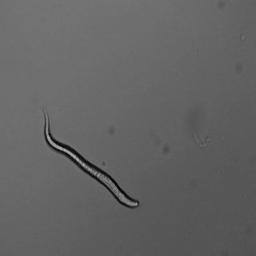

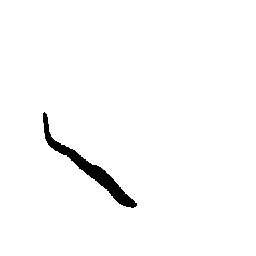

1/1 [==============================] - 0s 28ms/step


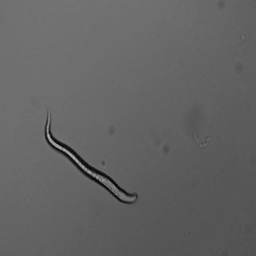

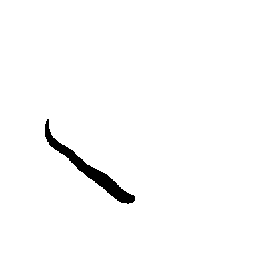

1/1 [==============================] - 0s 29ms/step


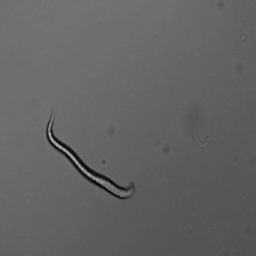

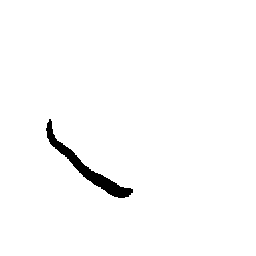

1/1 [==============================] - 0s 28ms/step


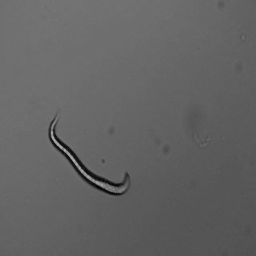

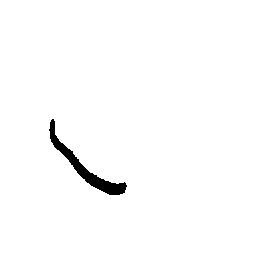

1/1 [==============================] - 0s 29ms/step


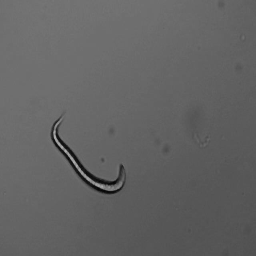

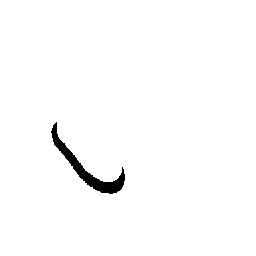

1/1 [==============================] - 0s 26ms/step


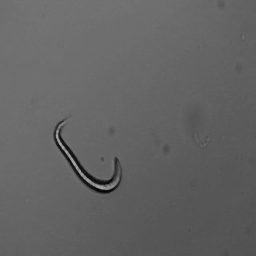

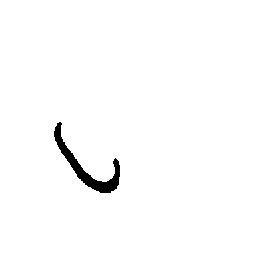

1/1 [==============================] - 0s 27ms/step


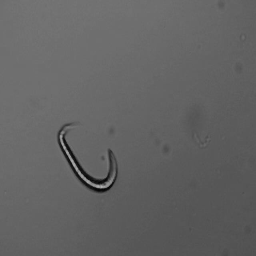

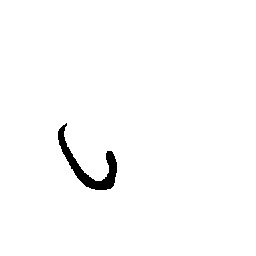

1/1 [==============================] - 0s 26ms/step


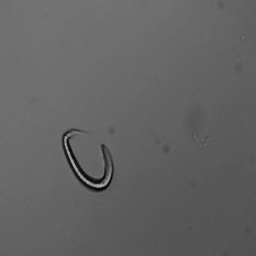

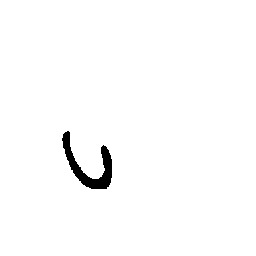

1/1 [==============================] - 0s 25ms/step


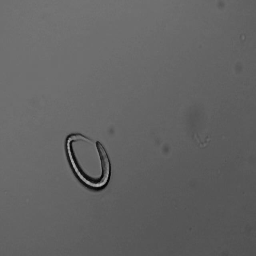

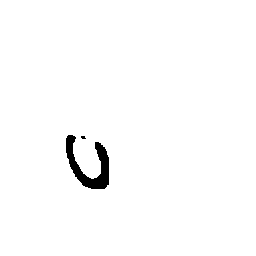

1/1 [==============================] - 0s 26ms/step


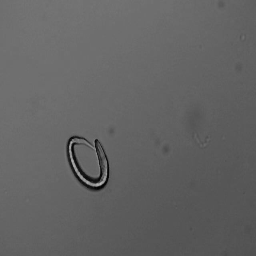

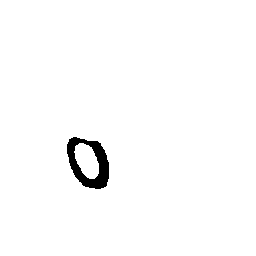

1/1 [==============================] - 0s 26ms/step


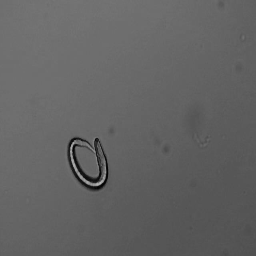

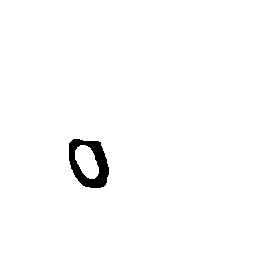

1/1 [==============================] - 0s 28ms/step


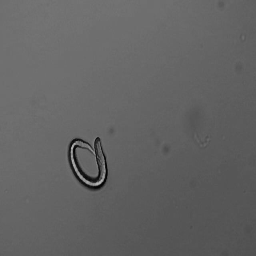

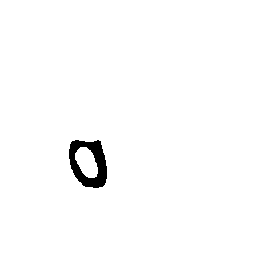

1/1 [==============================] - 0s 27ms/step


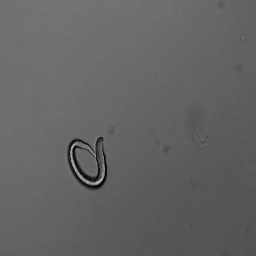

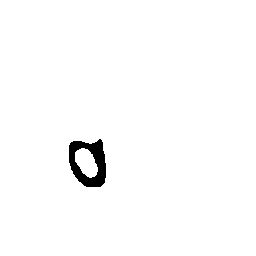

1/1 [==============================] - 0s 29ms/step


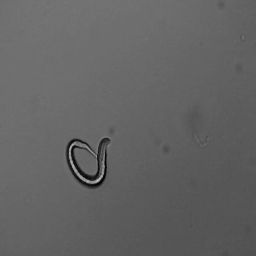

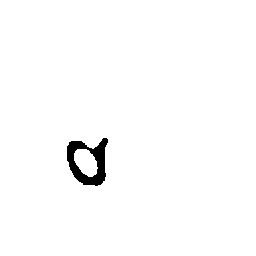

1/1 [==============================] - 0s 27ms/step


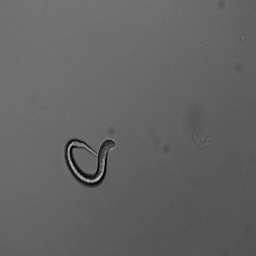

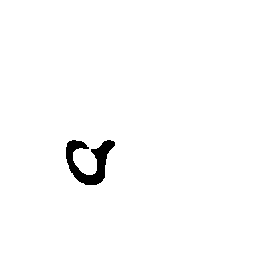

1/1 [==============================] - 0s 27ms/step


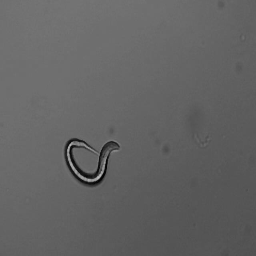

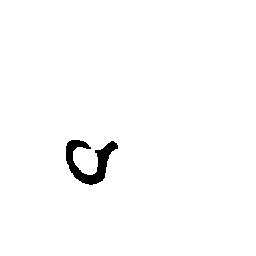

1/1 [==============================] - 0s 28ms/step


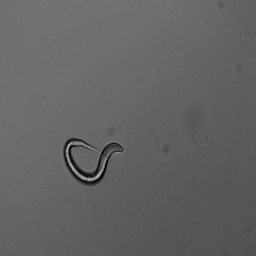

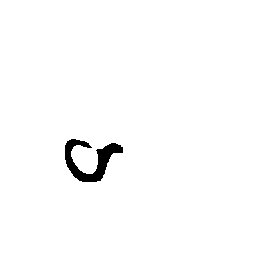

1/1 [==============================] - 0s 27ms/step


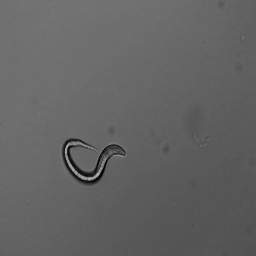

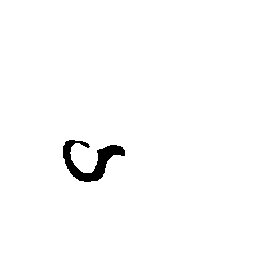

1/1 [==============================] - 0s 30ms/step


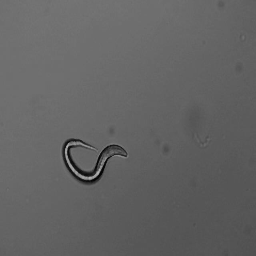

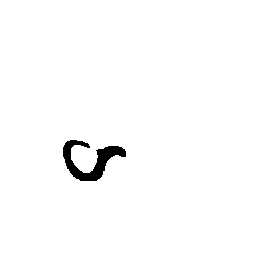

1/1 [==============================] - 0s 28ms/step


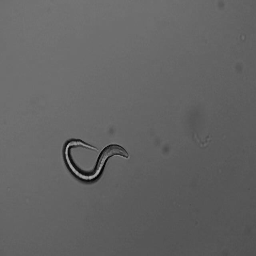

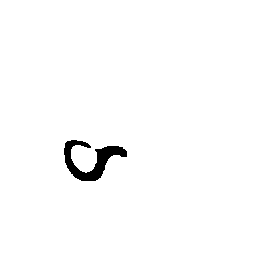

1/1 [==============================] - 0s 28ms/step


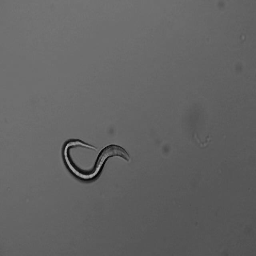

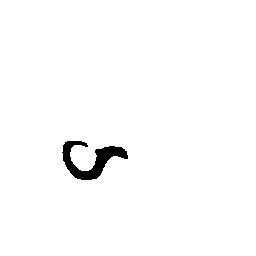

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

# Define a dictionary for custom objects
custom_objects = {
    'dice_coefficient': dice_coefficient,
    'jaccard_index': jaccard_index,

}

# Load the model with custom objects
model = load_model('/content/drive/MyDrive/image_segmentation.model', custom_objects=custom_objects)


# Define IMG_SIZE and load your trained model (make sure you have imported the model and defined IMG_SIZE elsewhere)
IMG_SIZE = 256
#model = load_model('/content/drive/MyDrive/image_segmentation.model')

video_path = '/content/drive/MyDrive/Video/20220322172908.avi'
video_capture = cv2.VideoCapture(video_path)

while True:
    ret, frame = video_capture.read()

    if not ret:
        break

    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    frame = cv2.resize(frame, (IMG_SIZE, IMG_SIZE))
    frame = frame / 255.0

    frame_input = frame.reshape(1, IMG_SIZE, IMG_SIZE, 1)
    segmentation_mask = model.predict(frame_input)

    # Apply pixel value multiplication and thresholding
    frame_for_display = (frame * 255).astype('uint8')
    segmentation_mask_for_display = (segmentation_mask[0] * 255 > 175).astype('uint8') * 255

    cv2_imshow(frame_for_display)
    cv2_imshow(segmentation_mask_for_display)

    # Add a delay to display each frame (e.g., waitKey(1) for a short delay)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

video_capture.release()
cv2.destroyAllWindows()